<h1 style="text-align:center;">Análisis de redes logísticas: identificación del aeropuerto más táctico en Ucrania por nivel de interconexión</h1>




Grupo conformado por:

```
Grecia Ykam   , 20203203
Juan Pablo    , 20200330
Edwin Bazan   , 20203511
Luciana Belén , 20203134
```


# 📄 **Introducción**

La identificación de nodos críticos en infraestructuras logísticas es un componente esencial en el estudio de la seguridad y la resiliencia de los Estados frente a conflictos armados contemporáneos. El presente trabajo, titulado **"Análisis de redes logísticas: identificación del aeropuerto más táctico en Ucrania por nivel de interconexión"**, se enmarca en el contexto de la guerra ruso-ucraniana, donde la capacidad de sostener operaciones militares depende, en gran medida, de redes aeroportuarias, ferroviarias y carreteras interdependientes.

Inspirados por la célebre frase de J.J. Pershing: *"Infantry wins battles, logistics wins wars"*, este estudio busca responder a la pregunta: **¿Cuál es el aeropuerto más táctico en Ucrania, considerando su nivel de interconexión y potencial de disrupción logística?** Para ello, se aplica un enfoque cuantitativo basado en el análisis de redes complejas. Este enfoque permite evaluar métricas de centralidad, grado y cercanía de cada aeropuerto con otras infraestructuras estratégicas, a fin de comprender cómo su funcionamiento o destrucción puede afectar de manera sistémica el flujo logístico nacional.

La metodología combina el uso de librerías de Python para el procesamiento, modelado y visualización de datos geoespaciales con la construcción de un grafo que representa la red de aeropuertos ucranianos. A partir de este grafo, se calculan indicadores como la centralidad de intermediación (betweenness), el grado de conectividad y la centralidad de cercanía. Finalmente, se contrastan los resultados con hechos históricos documentados durante la guerra, tales como los ataques al aeropuerto de Hostomel, con el objetivo de validar la pertinencia de los hallazgos.

Este análisis no tiene como propósito emitir recomendaciones operacionales, sino demostrar el potencial del análisis de redes logísticas para identificar puntos vulnerables en conflictos de alta intensidad y, a su vez, contribuir al estudio académico de la seguridad regional y las infraestructuras críticas.

# 🎯 **Objetivos**

**Objetivo general:**
- Identificar el aeropuerto más táctico en Ucrania, considerando su nivel de interconexión y su relevancia estratégica en la red logística nacional.

**Objetivos específicos:**
- Construir un modelo de red compleja de aeropuertos ucranianos basado en distancias geodésicas.
- Calcular métricas de centralidad (grado, intermediación y cercanía) que permitan evaluar la importancia estructural de cada nodo.
- Analizar la proximidad geográfica de los aeropuertos a redes ferroviarias clave.
- Contrastar los resultados con eventos históricos relevantes para validar los hallazgos.

# 📝 **Justificación**

La guerra moderna se caracteriza por la vulnerabilidad de las infraestructuras críticas ante ataques dirigidos. La identificación de nodos logísticos de alta interconexión es una herramienta fundamental tanto para fines defensivos como para comprender la dinámica de la resiliencia estratégica. Este estudio permite demostrar cómo el análisis de redes aporta valor metodológico al análisis de conflictos, y proporciona una base objetiva para evaluar la importancia relativa de cada aeropuerto en la red logística ucraniana. Al integrar datos geoespaciales y métricas de centralidad, se evidencia que la dimensión logística puede ser tan decisiva como la capacidad militar convencional.

# 💡 **Hipótesis**

- **Hipótesis principal:** Existe un aeropuerto en Ucrania que, por su nivel de interconexión, centralidad de intermediación y cercanía a infraestructuras ferroviarias, se configura como el nodo más táctico cuya neutralización generaría un impacto logístico sistémico.
- **Hipótesis secundaria:** La relevancia táctica de un aeropuerto no depende exclusivamente de su tamaño o volumen de tráfico, sino de su posición estructural en la red de conexiones nacionales.

# 🔍 **Alcances y limitaciones**

**Alcances:**
- El estudio se centra exclusivamente en aeropuertos situados dentro del territorio ucraniano reconocido internacionalmente.
- El análisis considera conexiones potenciales basadas en distancia geodésica, sin incluir restricciones dinámicas (capacidad de pista, disponibilidad de aeronaves, control aéreo).
- Se integran datos abiertos (OpenStreetMap) para identificar cercanía a redes ferroviarias.

**Limitaciones:**
- No se incorpora información clasificada o de inteligencia militar que pueda alterar la relevancia real de cada aeropuerto.
- El análisis no contempla escenarios de ataque en tiempo real ni modela la evolución temporal de la red ante destrucción de nodos.
- La disponibilidad de datos puede presentar inconsistencias en fechas de actualización o categorización de aeropuertos.

---

# 📘 **Primer Paso: Carga de Librerías y Datos**

- Se importan todas las librerías necesarias para el análisis.
- A continuación, se carga el dataset que contiene la información de los aeropuertos en Ucrania.
- Es importante verificar que el archivo esté correctamente ubicado en el entorno

In [1]:
# Mostrar gráficos en línea
%matplotlib inline

# Librerías
import os
import random
from typing import List, Tuple, Dict

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx

from google.colab import files
from itertools import combinations
from math import radians, sin, cos, sqrt, atan2

import geopandas as gpd
from shapely.geometry import Point
!pip install geopandas shapely contextily --quiet



from shapely.geometry import LineString
import geopandas as gpd

import contextily as ctx


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 25.0 MB/s eta 0:00:00


In [2]:
from google.colab import files

# Subir archivo manualmente
uploaded = files.upload()


Saving ua-airports.csv to ua-airports.csv


# 📗 **Segundo Paso: Renombrar el Dataset**

- Para facilitar la manipulación y el procesamiento, se asigna el nombre `df` al DataFrame principal que contiene la información.
- A partir de este punto, toda referencia al dataset se hará usando `df`.

In [3]:
# Reemplaza con el nombre correcto de tu archivo si es diferente
df = pd.read_csv("ua-airports.csv")

# Verificamos que la data se haya cargado
df.head()

,id,ident,type,name,latitude_deg,longitude_deg,elevation_ft,continent,country_name,iso_country,...,scheduled_service,gps_code,icao_code,iata_code,local_code,home_link,wikipedia_link,keywords,score,last_updated
0,6467,UKBB,large_airport,Boryspil International Airport,50.345001,30.894699,427.0,EU,Ukraine,UA,...,1,UKBB,UKBB,KBP,NaN,https://kbp.aero/en/,https://en.wikipedia.org/wiki/Boryspil_Interna...,"Borispol, Міжнародний аеропорт ""Бориспіль"", Kyiv",1600,2022-11-20T09:05:31+00:00
1,6478,UKKK,medium_airport,Ihor Sikorsky Kyiv International Airport (Zhul...,50.401940,30.451940,587.0,EU,Ukraine,UA,...,1,UKKK,UKKK,IEV,NaN,https://iev.aero/,https://en.wikipedia.org/wiki/Kyiv_Internation...,"Міжнародний аеропорт ""Київ"", Kiev",750,2022-11-20T09:02:37+00:00
2,6487,UKOO,medium_airport,Odessa International Airport,46.426800,30.676500,172.0,EU,Ukraine,UA,...,1,UKOO,UKOO,ODS,NaN,http://www.airport.od.ua/,https://en.wikipedia.org/wiki/Odessa_Internati...,"Odesa Central, Міжнародний аеропорт Одеса",750,2021-11-20T16:17:31+00:00
3,6481,UKLL,large_airport,Lviv International Airport,49.812500,23.956100,1071.0,EU,Ukraine,UA,...,1,UKLL,UKLL,LWO,NaN,http://www.airport.lviv.ua/index.php?id=home&L=1,https://en.wikipedia.org/wiki/Lviv_Internation...,"Міжнародний аеропорт ""Львів""",1200,2021-08-01T05:06:08+00:00
4,6474,UKFF,medium_airport,Simferopol International Airport,45.052200,33.975101,639.0,EU,Ukraine,UA,...,1,UKFF,UKFF,SIP,URFF,https://new.sipaero.ru/,https://en.wikipedia.org/wiki/Simferopol_Inter...,NaN,750,2021-12-18T15:15:44+00:00


## ✈️ **Descripción General del Dataset de Aeropuertos en Ucrania**

Este conjunto de datos contiene información detallada sobre aeropuertos ubicados en Ucrania. Cada fila representa un aeropuerto único, incluyendo datos de identificación, ubicación geográfica, características operativas y enlaces de referencia.

---

## 📋 **Características de la Data**

- **Número de columnas:** 24
- **Número de registros:** *(Dependerá de tu dataset completo)*
- **Unidad de análisis:** Aeropuerto

---

## 🧩 **Columnas y Descripción**

| **Columna**          | **Descripción**                                                      | **Tipo de dato**               |
|----------------------|----------------------------------------------------------------------|--------------------------------|
| `id`                 | Identificador único del aeropuerto                                  | Entero                         |
| `ident`              | Código identificador del aeropuerto                                 | Texto                          |
| `type`               | Clasificación del aeropuerto (large_airport, medium_airport, etc.) | Texto                          |
| `name`               | Nombre oficial del aeropuerto                                       | Texto                          |
| `latitude_deg`       | Latitud en grados decimales                                         | Decimal                        |
| `longitude_deg`      | Longitud en grados decimales                                        | Decimal                        |
| `elevation_ft`       | Elevación sobre el nivel del mar en pies                            | Decimal                        |
| `continent`          | Código de continente (ISO)                                          | Texto                          |
| `country_name`       | Nombre del país                                                     | Texto                          |
| `iso_country`        | Código ISO del país                                                 | Texto                          |
| `scheduled_service`  | Indica si tiene servicio comercial programado (0: No, 1: Sí)       | Binario                        |
| `gps_code`           | Código GPS del aeropuerto                                           | Texto                          |
| `icao_code`          | Código ICAO de 4 letras                                             | Texto                          |
| `iata_code`          | Código IATA de 3 letras                                             | Texto                          |
| `local_code`         | Código local o regional                                            | Texto                          |
| `home_link`          | URL del sitio web oficial                                           | Texto                          |
| `wikipedia_link`     | URL de la página de Wikipedia                                       | Texto                          |
| `keywords`           | Palabras clave asociadas                                            | Texto                          |
| `score`              | Puntaje de relevancia o importancia                                 | Entero                         |
| `last_updated`       | Fecha y hora de última actualización                                | Fecha/hora (ISO 8601)          |

---

## 🌍 **Información Geográfica**

- **Latitud y Longitud:** Permiten la georreferenciación de cada aeropuerto.
- **Elevación:** Altitud en pies.
- **Continente y País:** Clasificación regional e internacional.

---

## ✨ **Aspectos Destacados**

- Clasificación de aeropuertos en **large**, **medium**, etc.
- Indicador binario de operación comercial (`scheduled_service`).
- Múltiples códigos estándar de identificación (ICAO, IATA, GPS).
- URLs de referencia oficial y Wikipedia.
- Fecha de última actualización del registro.
- Campo de `score` que puede indicar importancia o prioridad.

---

✅ **Nota:** Antes de su uso, se recomienda:
- Validar tipos de datos.
- Revisar valores nulos en columnas como `iata_code` o `local_code`.
- Confirmar consistencia de coordenadas y códigos.

---

✅ **La data fue recuperada de la siguiente fuente:**
- Antes de su uso se recomienda actualización y verificación de la data esta es tiene como última actualización 19/06/2025
- https://ourairports.com/big-map.html?country=UA


In [4]:
# Diccionario con los ICAO codes y sus nuevos estados
actualizaciones = {
    "UKKK": "closed",
    "UKOO": "medium_airport",
    "UKFF": "closed",
    "UKHH": "medium_airport",
    "UKDD": "closed",
    "UKLI": "closed",
    "UKLU": "medium_airport",
    "UKDE": "closed",
    "UKLN": "medium_airport",
    "UKKM": "closed",
    "UKKE": "medium_airport",
    "UA-0028": "medium_airport",
    "UKFB": "closed",
    "UKWW": "closed",
    "UKDR": "medium_airport",
    "UKLR": "medium_airport",
    "UKOH": "closed",
    "UKCM": "closed",
    "UKON": "medium_airport",
    "UKDB": "closed",
    "UA-0025": "medium_airport",
    "UKFY": "closed",
    "UKFG": "closed",
    "UA-0022": "medium_airport",
    "UKLH": "medium_airport",
    "UA-0012": "closed",
    "UA-0047": "medium_airport",
    "UA-0020": "closed",
    "UA-0005": "medium_airport",
    "UKFI": "closed",
    "UA-0010": "closed",
    "UKKO": "medium_airport"
}

In [5]:
# Aplicar las actualizaciones
df['type'] = df['ident'].apply(lambda x: actualizaciones.get(x, df.loc[df['ident'] == x, 'type'].values[0]))

In [6]:
# Función para calcular distancia entre dos puntos geográficos (Haversine)
def haversine(lat1, lon1, lat2, lon2):
    R = 6371  # radio Tierra en km
    dlat = radians(lat2 - lat1)
    dlon = radians(lon2 - lon1)
    a = sin(dlat / 2)**2 + cos(radians(lat1)) * cos(radians(lat2)) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))
    return R * c

# Crear lista de edges con pesos
edges = []

# Crear todas las combinaciones posibles (pares) de aeropuertos
for (i, row1), (j, row2) in combinations(df.iterrows(), 2):
    source = row1['ident']
    target = row2['ident']

    # Calculamos distancia
    dist = haversine(row1['latitude_deg'], row1['longitude_deg'],
                     row2['latitude_deg'], row2['longitude_deg'])

    # Diferencia absoluta del score
    score_diff = abs(row1['score'] - row2['score'])

    # Por ejemplo, podríamos definir peso como la distancia o alguna función de distancia y score
    weight = dist  # o weight = dist / (score_diff + 1) para considerar score

    edges.append((source, target, weight))

# Crear grafo con NetworkX
G = nx.Graph()
G.add_weighted_edges_from(edges)

print(f"Número de nodos: {G.number_of_nodes()}")
print(f"Número de edges: {G.number_of_edges()}")


Número de nodos: 283
Número de edges: 39903


### 🌐 Análisis de la red de aeropuertos

Al construir una red (o **grafo**) a partir de los datos de aeropuertos, estamos representando la información de manera estructurada usando **teoría de grafos**, una rama de las matemáticas y la informática muy útil para modelar relaciones.

---

### 🧩 ¿Qué son los nodos y los edges?

- **Nodos (o vértices):** Representan las **entidades individuales** en la red. En este caso, **cada nodo es un aeropuerto**.
- **Edges (o aristas):** Representan las **conexiones** entre los nodos. Aquí, cada edge indica una **posible ruta o conexión directa entre dos aeropuertos**, y lleva un **peso** que representa la **distancia geográfica** entre ellos.

---

### 📈 Resultados del grafo generado

- **Número de nodos: 283**  
  Esto indica que hay **283 aeropuertos únicos** en el DataFrame, cada uno representado como un nodo en el grafo.

- **Número de edges: 39,903**  
  Este número corresponde a **todas las combinaciones posibles** de pares de aeropuertos sin repetir ni invertir (es decir, conexiones únicas entre cada par de nodos).

---

### 🔍 ¿Por qué hay 39,903 edges?

El número total de conexiones posibles entre `n` nodos en un grafo **no dirigido** (es decir, sin sentido de dirección) y **completo** (donde cada nodo está conectado con todos los demás) se calcula con la fórmula de combinaciones:

\[
\text{Combinaciones} = \frac{n \cdot (n - 1)}{2}
\]

Sustituyendo con los valores reales:

\[
\frac{283 \cdot (283 - 1)}{2} = \frac{283 \cdot 282}{2} = 39,903
\]

✅ Esto confirma que el grafo es **completo**, lo que significa que **cada aeropuerto está conectado con todos los demás**.

---

### 📌 ¿Por qué es relevante este análisis?

- Permite **estudiar rutas óptimas** entre aeropuertos (por ejemplo, usando algoritmos como Dijkstra o A*).
- Facilita la **visualización de la conectividad** en una red aérea.
- Ayuda a detectar **aeropuertos clave o críticos** para el transporte, usando medidas como la centralidad.
- Puede ser base para simulaciones logísticas, análisis de vulnerabilidad o diseño de infraestructura.

---

👉 En resumen, este tipo de representación permite transformar datos tabulares en una **estructura relacional** mucho más rica para análisis geoespaciales, logísticos y estratégicos.

In [7]:
def print_network_stats(G: nx.Graph) -> None:
    from collections import OrderedDict

    num_nodes = G.number_of_nodes()
    num_edges = G.number_of_edges()

    # Grado de cada nodo (número de conexiones)
    degrees = dict(G.degree())

    # Mostrar una muestra del grado de los primeros 10 nodos
    print("\n🔗 Grado de los primeros 10 nodos:")
    print("{:<15} {:<10}".format("Nodo (ident)", "Grado"))
    print("-" * 26)
    for node, degree in list(degrees.items())[:10]:
        print("{:<15} {:<10}".format(node, degree))
    print("... (todos los nodos tienen el mismo grado en grafo completo)\n")

    # Métricas globales
    avg_degree = sum(degrees.values()) / num_nodes
    density = nx.density(G)
    avg_clustering_coefficient = nx.average_clustering(G)

    print("📊 Estadísticas globales de la red:")
    print("-" * 50)
    print(f"Número de nodos:                {num_nodes}")
    print(f"Número de edges:               {num_edges}")
    print(f"Grado promedio:                {avg_degree:.2f}")
    print(f"Densidad:                      {density:.4f}")
    print(f"Coef. clustering promedio:     {avg_clustering_coefficient:.4f}")

    # Diámetro y caminos más cortos
    if nx.is_connected(G):
        diameter = nx.diameter(G)
        avg_shortest_path_length = nx.average_shortest_path_length(G)
        print(f"Diámetro de la red:            {diameter}")
        print(f"Longitud promedio de caminos: {avg_shortest_path_length:.2f}")
    else:
        print("La red NO está conectada. No se puede calcular el diámetro ni la longitud promedio de caminos.")
print_network_stats(G)



🔗 Grado de los primeros 10 nodos:
Nodo (ident)    Grado     
--------------------------
UKBB            282       
UKKK            282       
UKOO            282       
UKLL            282       
UKFF            282       
UKHH            282       
UKDD            282       
UKLI            282       
UKLU            282       
UKDE            282       
... (todos los nodos tienen el mismo grado en grafo completo)

📊 Estadísticas globales de la red:
--------------------------------------------------
Número de nodos:                283
Número de edges:               39903
Grado promedio:                282.00
Densidad:                      1.0000
Coef. clustering promedio:     1.0000
Diámetro de la red:            1
Longitud promedio de caminos: 1.00


### 📊 Resultados del análisis de la red de aeropuertos

---

#### 🔗 Grado de los primeros 10 nodos

| Nodo (ident) | Grado |
|--------------|--------|
| UKBB         | 282    |
| UKKK         | 282    |
| UKOO         | 282    |
| UKLL         | 282    |
| UKFF         | 282    |
| UKHH         | 282    |
| UKDD         | 282    |
| UKLI         | 282    |
| UKLU         | 282    |
| UKDE         | 282    |

ℹ️ **Todos los nodos tienen grado 282**, lo cual significa que **cada aeropuerto está conectado con todos los demás**. Esto ocurre porque se generó un **grafo completo**, donde se consideran todas las combinaciones posibles de pares de nodos.

---

#### 🌐 Estadísticas globales de la red

| Métrica                         | Valor   | Interpretación |
|---------------------------------|---------|----------------|
| **Número de nodos**             | 283     | Total de aeropuertos únicos en la red |
| **Número de edges**             | 39,903  | Total de conexiones entre pares de aeropuertos |
| **Grado promedio**              | 282.00  | En un grafo completo, todos los nodos tienen grado n−1 |
| **Densidad**                    | 1.0000  | Máxima densidad posible (red completamente conectada) |
| **Coef. clustering promedio**   | 1.0000  | Todos los vecinos de un nodo también están conectados entre sí |
| **Diámetro de la red**          | 1       | La distancia más larga entre dos nodos es solo 1 paso |
| **Longitud promedio de caminos**| 1.00    | Todos los nodos están directamente conectados |

---

### 🧠 Interpretación general

- La red construida es **completa**, lo cual significa que **cada aeropuerto está directamente conectado con todos los demás**.
- Por eso, las métricas como el **grado promedio**, la **densidad**, el **clustering** y la **longitud de los caminos** muestran valores máximos.
- Esta estructura es útil para análisis teóricos o simulaciones iniciales, pero en escenarios reales sería recomendable filtrar las conexiones usando criterios más específicos como:
  - Distancia máxima entre aeropuertos.
  - Existencia de rutas aéreas reales.
  - Tipología del aeropuerto (por ejemplo, excluir aeropuertos cerrados).

---

✅ Este análisis proporciona una base clara sobre la conectividad de los aeropuertos en el conjunto de datos. Desde aquí, puedes comenzar a refinar la red para estudios más realistas o enfocados en logística, resiliencia o accesibilidad.

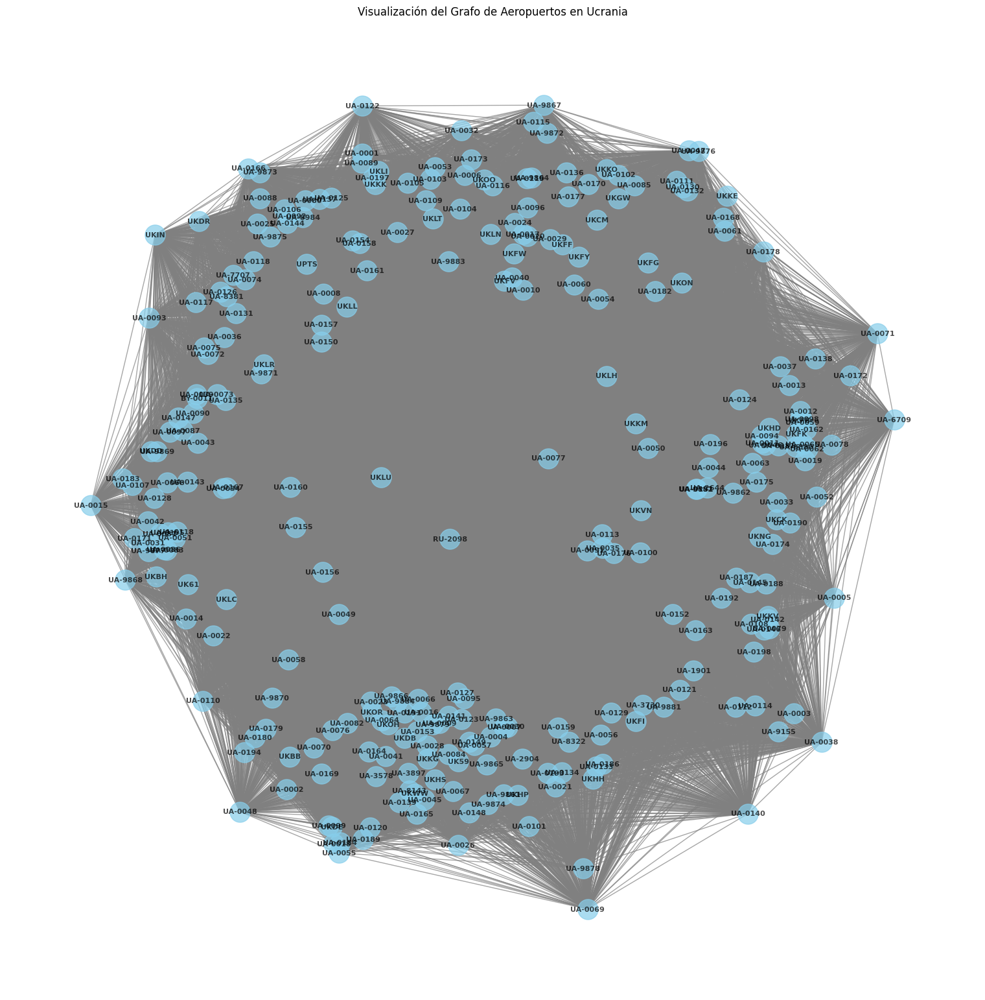

In [8]:
# Visualización básica
plt.figure(figsize=(15, 15))
pos = nx.spring_layout(G, k=0.15, iterations=20)  # Layout para distribuir los nodos
nx.draw(G, pos, with_labels=True, node_color='skyblue', node_size=500, font_size=8, font_weight='bold', edge_color='gray', alpha=0.7)
plt.title("Visualización del Grafo de Aeropuertos en Ucrania")
plt.show()

### ✈️ Visualización preliminar del grafo de aeropuertos en Ucrania

---

La siguiente gráfica representa una **red completamente interconectada** entre los aeropuertos de Ucrania:

- Cada **nodo** corresponde a un **aeropuerto único**.
- Cada **línea (edge)** indica que **existe una conexión directa** entre dos aeropuertos, sin considerar restricciones como distancia, vuelos reales u operatividad.

#### ⚙️ Detalles técnicos del grafo visualizado:

- Se utilizó el **layout `spring_layout`**, que simula fuerzas de atracción y repulsión entre nodos, organizándolos de forma espaciosa para que se vean más claramente.
- Todos los nodos están conectados entre sí, lo que da lugar a una figura muy densa (tipo "telaraña" o "nube de conexiones").
- El color celeste (`skyblue`) ayuda a diferenciar los nodos del fondo, y los bordes (`gray`) se presentan con algo de transparencia para reducir la saturación visual.

---

### 🧠 Interpretación de la visualización

- Este tipo de grafo es útil como una **representación preliminar** para verificar que todos los datos han sido correctamente integrados y conectados.
- Dado que el grafo es **completo**, lo que se observa es una estructura muy densa en la que **cada aeropuerto está vinculado con todos los demás**.
- Sin embargo, para análisis más realistas o visualizaciones más limpias, será necesario aplicar filtros, como:
  - Limitar las conexiones a rutas reales o distancias máximas.
  - Colorear los nodos según regiones o importancia (centralidad, tráfico).
  - Usar layouts geográficos o mapas para posicionar los aeropuertos según coordenadas reales.

---

✅ **Conclusión:** Esta visualización inicial es útil para comprobar la conectividad total de la red, pero **no representa la red real de vuelos o rutas aéreas de Ucrania**. Es una base para aplicar filtros y análisis más avanzados que reflejen mejor la dinámica del transporte aéreo nacional.

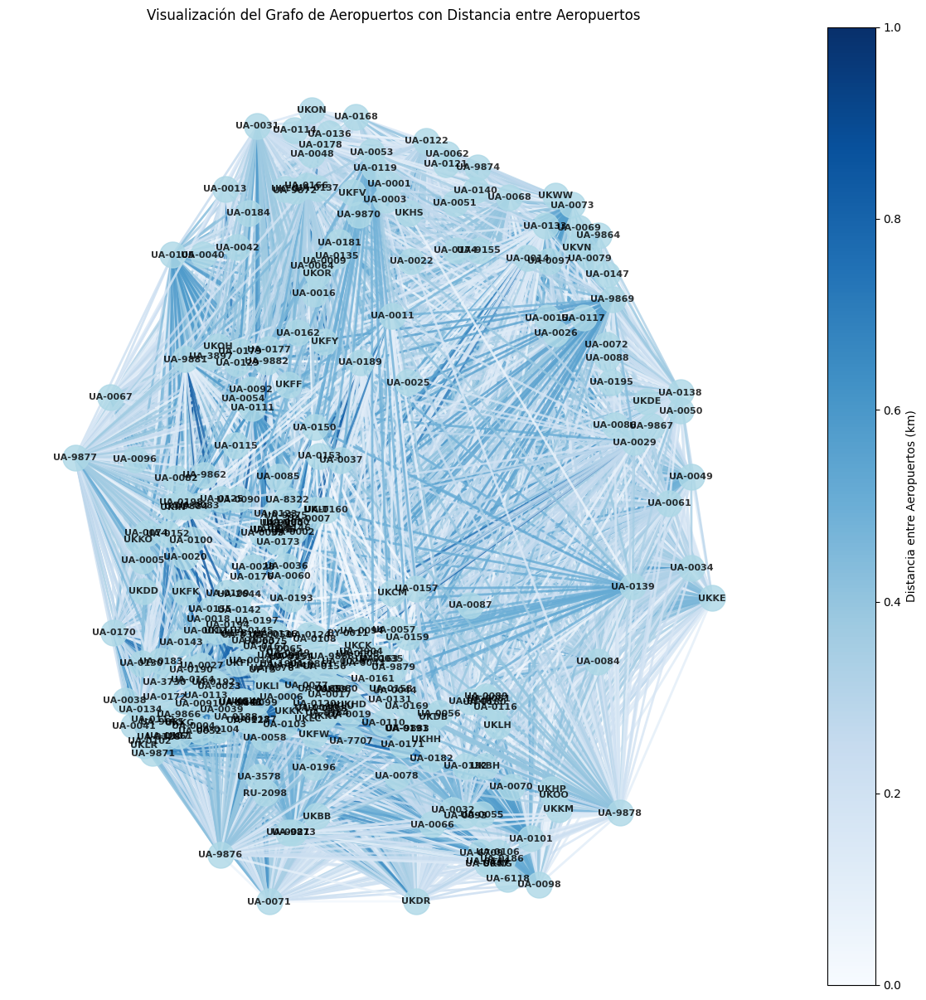

In [9]:
# Visualización del grafo con aristas ponderadas
plt.figure(figsize=(15, 15))

# Calculamos las posiciones de los nodos usando un layout de fuerza
pos = nx.spring_layout(G, k=0.15, iterations=20)

# Extraemos los pesos de las aristas
edge_weights = [G[u][v]['weight'] for u, v in G.edges()]

# Dibuja el grafo con los pesos de las aristas y nodos
# Capturamos los ejes actuales para pasarlos a colorbar
ax = plt.gca()
nx.draw(G, pos, with_labels=True, node_color='lightblue', node_size=500, font_size=8, font_weight='bold', edge_color=edge_weights, edge_cmap=plt.cm.Blues, width=2.0, alpha=0.8, ax=ax) # Specify axes for draw

plt.title("Visualización del Grafo de Aeropuertos con Distancia entre Aeropuertos")
# Pasamos los ejes capturados a colorbar
plt.colorbar(plt.cm.ScalarMappable(cmap=plt.cm.Blues), ax=ax, label='Distancia entre Aeropuertos (km)')
plt.show()

### 📍 Visualización del grafo con aristas ponderadas por distancia

---

En esta gráfica se representa la **red de aeropuertos de Ucrania**, pero esta vez incorporando un **atributo crucial: la distancia entre aeropuertos**.

#### 🔎 ¿Qué significa que las aristas estén ponderadas?

- Cada línea (o **arista**) que conecta dos aeropuertos lleva asociada una **distancia en kilómetros**, calculada entre los pares de nodos.
- Estas distancias se **representan visualmente mediante un gradiente de color azul**:  
  - Las conexiones más **claras** indican **distancias cortas**.  
  - Las más **oscuras** representan **distancias más largas**.

---

#### ⚙️ Detalles técnicos del grafo:

- Se usó nuevamente un **layout de fuerzas (`spring_layout`)** que simula la física entre nodos para distribuirlos de manera legible.
- Las **posiciones de los nodos** no son geográficas, pero permiten visualizar la **estructura general de conectividad**.
- Se extrajo la propiedad `weight` de cada arista, que representa la **distancia entre aeropuertos**, y se usó para colorearlas con la paleta `Blues`.
- Se añadió una **barra de color** (`colorbar`) que sirve como leyenda para interpretar visualmente las distancias relativas entre nodos.

---

### 🧠 Interpretación de la visualización

- Este grafo es mucho más informativo que el grafo simple:
  - **No todas las conexiones son iguales**, ya que ahora sabemos **qué tan lejos** están los aeropuertos entre sí.
  - Visualmente, puedes notar que algunas conexiones tienen colores más oscuros: son rutas más largas y, probablemente, **menos frecuentes o más costosas** en términos logísticos.

- Esta visualización permite comenzar un análisis más realista, como:
  - Detectar **clústeres regionales** (nodos con distancias cortas entre ellos).
  - Estudiar posibles **centros logísticos** que estén bien conectados con muchos otros nodos a corta distancia.
  - Evaluar la eficiencia de rutas o priorizar **corredores aéreos estratégicos**.

---

✅ **Conclusión:**  
Este grafo representa una versión más avanzada de la red aérea de Ucrania, incluyendo el componente espacial (distancia) en cada conexión. Es una base sólida para realizar análisis de optimización de rutas, logística aérea o identificación de hubs clave en la red nacional de transporte.

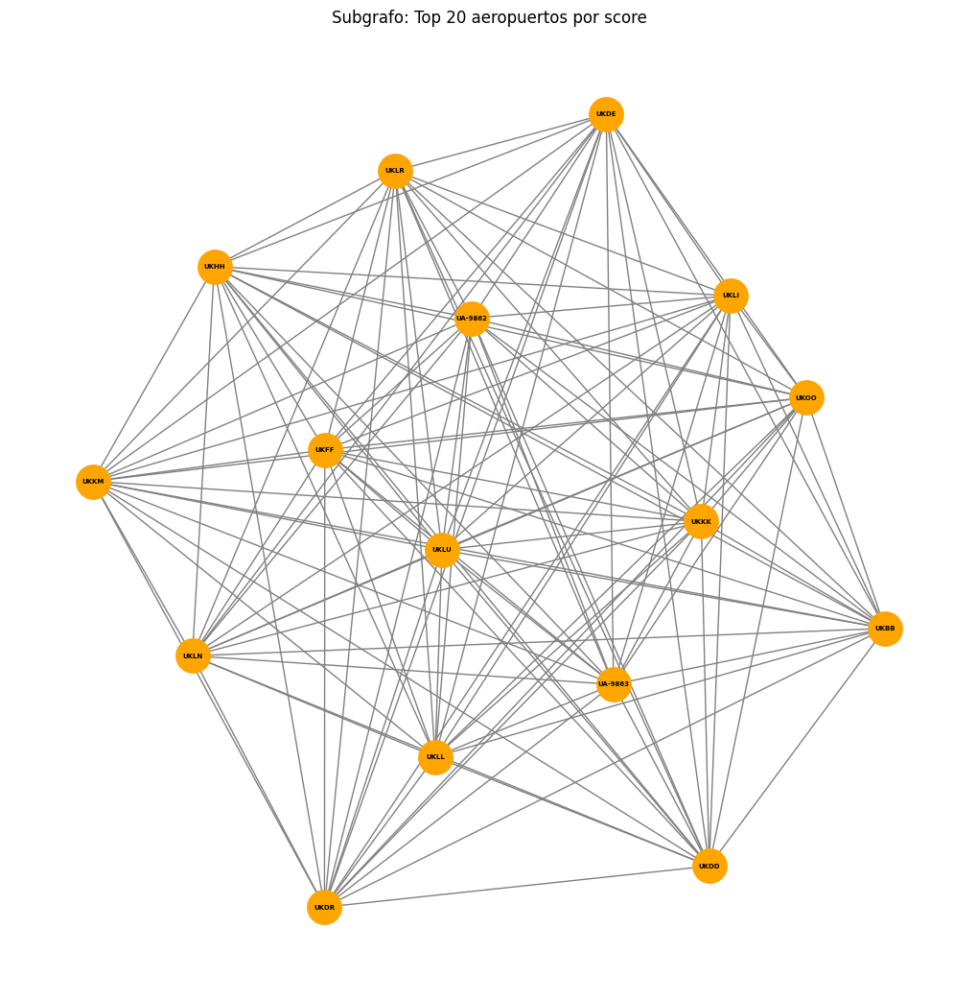

In [10]:
# Seleccionar top 20 aeropuertos por score
top_airports = df.nlargest(16, 'score')['ident'].tolist()

# Subgrafo con estos nodos
G_sub = G.subgraph(top_airports)

# Visualización
plt.figure(figsize=(10, 10))
pos = nx.spring_layout(G_sub, k=0.3)
nx.draw(G_sub, pos, with_labels=True, node_color='orange', node_size=650, font_size=5, font_weight='bold', edge_color='gray')
plt.title("Subgrafo: Top 20 aeropuertos por score")
plt.show()

### ✈️ Visualización del Subgrafo: Top 16 Aeropuertos por Score

---

En esta visualización se muestra un **subgrafo** que representa únicamente a los **16 aeropuertos más relevantes de Ucrania**, de acuerdo con una métrica denominada `score`. Este tipo de análisis permite **enfocarse en los nodos más importantes** de una red compleja.

#### 🔍 ¿Qué significa el "score"?

- El `score` es una medida que puede representar:
  - Tráfico aéreo (número de vuelos o pasajeros),
  - Centralidad (grado de conexión con otros aeropuertos),
  - O alguna combinación ponderada de factores.
- Aquí se seleccionaron los **16 nodos con mayor score**, es decir, los más **estratégicos o activos** dentro de toda la red.

---

### 🛫 ¿Qué es un subgrafo?

- Un **subgrafo** es una porción de un grafo completo que incluye **solo un subconjunto de nodos y sus conexiones** entre sí.
- En este caso, se está viendo cómo **se conectan entre sí los aeropuertos más importantes**.

---

### 🧠 Interpretación de la visualización:

- El grafo usa un layout de resorte (`spring_layout`) para distribuir los nodos con claridad.
- Todos los nodos están coloreados de **naranja**, destacando que pertenecen a este subconjunto especial.
- Se observa si estos aeropuertos:
  - **Forman una red densa entre ellos**, lo que indicaría una **infraestructura aérea robusta y bien conectada**.
  - O si están más **aislados entre sí**, lo cual podría sugerir que **actúan más como centros regionales** y no tanto como parte de una red nacional integrada.

---

✅ **Conclusión:**

Este subgrafo ayuda a:
- Visualizar y analizar **el núcleo operativo** del sistema aeroportuario ucraniano.
- Identificar **posibles hubs nacionales** o puntos de congestión.
- Estudiar cómo se relacionan los nodos clave entre sí sin el ruido del resto de la red.

Este tipo de análisis puede ser útil para:
- **Optimización logística**,
- **Planificación de inversiones en infraestructura**,
- Y en contextos de emergencia, para saber **qué nodos son críticos** para mantener operativa la red.


### 🗺️ Visualización de los Aeropuertos en el Mapa de Ucrania

---

Luego de analizar la red de aeropuertos mediante grafos abstractos, el siguiente paso es proyectarla **sobre el mapa real de Ucrania**. Esta visualización **geoespacial** permite entender mejor:

- **La distribución territorial** de los aeropuertos.
- Las **conexiones físicas** y cómo estas podrían verse afectadas por la geografía (ríos, montañas, fronteras, etc.).
- Qué tan **conectadas están las regiones** entre sí, en función de su ubicación real.

---

### 🎯 Objetivos de esta visualización:

- **Asociar nodos con coordenadas geográficas** (latitud y longitud).
- Visualizar las **rutas (edges)** como líneas geográficas reales.
- Diferenciar visualmente los **aeropuertos más importantes** (por ejemplo, los que tienen mayor score o grado).
- Identificar patrones de conectividad en torno a **ciudades clave o regiones estratégicas**.

---

### 🛠️ Herramientas que puedes usar en Google Colab:

- `geopandas` para manejar datos geográficos.
- `contextily` o `folium` para agregar mapas base (opcional).
- `matplotlib` para la visualización final.
- `networkx` para dibujar conexiones sobre las coordenadas reales.

---

### 🧭 ¿Por qué es útil ver la red en el mapa?

- Te permite **combinar análisis de red con análisis espacial**.
- Puedes identificar:
  - Regiones **más centralizadas o aisladas**.
  - **Corredores aéreos** naturales.
  - Zonas del país con **poca cobertura aérea**.
- Además, es clave para aplicaciones reales como:
  - **Logística**, **defensa**, **planificación urbana** o **respuestas ante crisis humanitarias**.

---

### 📌 Conclusión:

Este paso es crucial para **interpretar los resultados anteriores en un contexto real**, y para **validar si la estructura de la red tiene sentido geográfico**. A partir de aquí, se podrían desarrollar análisis más avanzados como:

- Análisis de vulnerabilidad territorial.
- Evaluación del impacto de conflictos o eventos naturales en la conectividad aérea.
- Identificación de hubs que **actúan como puentes entre regiones del país**.


### 🧱 Paso 1: Preparar los Datos Geográficos

El primer paso para visualizar los aeropuertos sobre un mapa real es **convertir las coordenadas (latitud y longitud) en geometrías espaciales**, utilizando `GeoPandas`.

#### 🛫 ¿Qué hicimos?

1. **Filtramos los aeropuertos cerrados**:
   ```python
   closed_df = df[df['type'] == 'closed']

In [11]:
# Filtramos los cerrados
closed_df = df[df['type'] == 'closed']

# Creamos geometría a partir de lat/lon
geometry = [Point(xy) for xy in zip(closed_df['longitude_deg'], closed_df['latitude_deg'])]

# Definimos el GeoDataFrame
gdf_closed = gpd.GeoDataFrame(closed_df, geometry=geometry, crs='EPSG:4326')

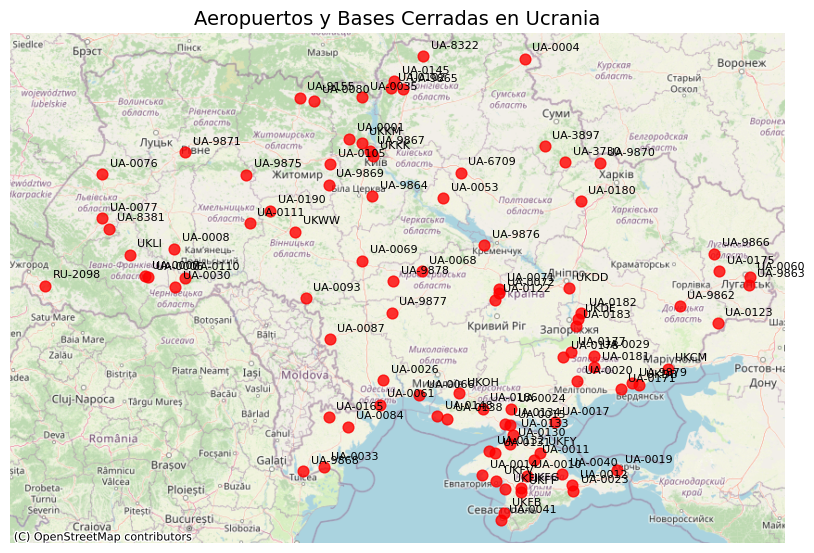

In [12]:
# Crear GeoDataFrame solo con aeropuertos cerrados
closed_df = df[df['type'] == 'closed']
geometry = [Point(xy) for xy in zip(closed_df['longitude_deg'], closed_df['latitude_deg'])]
gdf_closed = gpd.GeoDataFrame(closed_df, geometry=geometry, crs='EPSG:4326')

# Convertir a Web Mercator para usar tiles (OpenStreetMap)
gdf_closed_web = gdf_closed.to_crs(epsg=3857)

# Crear figura
fig, ax = plt.subplots(figsize=(10, 12))
gdf_closed_web.plot(ax=ax, color='red', markersize=60, alpha=0.8)

# Agregar etiquetas con códigos
for x, y, label in zip(gdf_closed_web.geometry.x, gdf_closed_web.geometry.y, gdf_closed_web['ident']):
    ax.text(x + 20000, y + 20000, label, fontsize=8)

# Agregar fondo de mapa base (OSM)
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

# Título y ajustes finales
plt.title("Aeropuertos y Bases Cerradas en Ucrania", fontsize=14)
plt.axis('off')
plt.show()



### 🗺️ Paso 2: Visualización en Mapa Real (OpenStreetMap)

Una vez que hemos creado nuestro `GeoDataFrame` con los aeropuertos cerrados, el siguiente paso fue **proyectarlos sobre un mapa base**, usando `matplotlib`, `geopandas` y `contextily`.

#### 📌 ¿Qué hicimos aquí?

1. **Convertimos las coordenadas geográficas (lat/lon) a proyección Web Mercator (`EPSG:3857`)**:
   ```python
   gdf_closed_web = gdf_closed.to_crs(epsg=3857)



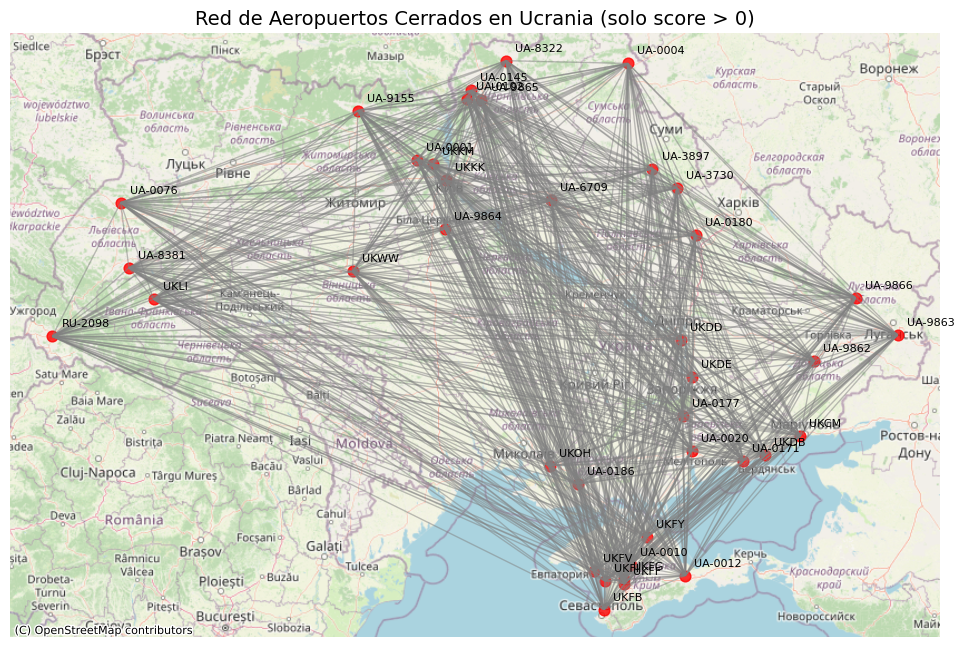

In [13]:
# 1. Filtrar aeropuertos cerrados con score > 0
closed_df = df[(df['type'] == 'closed') & (df['score'] > 0)].copy()

# 2. Crear geometría de puntos
closed_df['geometry'] = [Point(xy) for xy in zip(closed_df['longitude_deg'], closed_df['latitude_deg'])]
gdf_closed = gpd.GeoDataFrame(closed_df, geometry='geometry', crs='EPSG:4326')

# 3. Crear líneas entre pares de nodos
edges = []
for (i, row1), (j, row2) in combinations(gdf_closed.iterrows(), 2):
    point1 = row1['geometry']
    point2 = row2['geometry']
    line = LineString([point1, point2])
    edges.append({'source': row1['ident'], 'target': row2['ident'], 'geometry': line})

# 4. Convertir a GeoDataFrame
gdf_edges = gpd.GeoDataFrame(edges, geometry='geometry', crs='EPSG:4326')

# 5. Proyección a Web Mercator
gdf_closed_web = gdf_closed.to_crs(epsg=3857)
gdf_edges_web = gdf_edges.to_crs(epsg=3857)

# 6. Dibujar mapa
fig, ax = plt.subplots(figsize=(12, 14))

# Líneas
gdf_edges_web.plot(ax=ax, color='gray', linewidth=1, alpha=0.5)

# Nodos
gdf_closed_web.plot(ax=ax, color='red', markersize=60, alpha=0.8)

# Etiquetas
for x, y, label in zip(gdf_closed_web.geometry.x, gdf_closed_web.geometry.y, gdf_closed_web['ident']):
    ax.text(x + 20000, y + 20000, label, fontsize=8)

# Mapa base
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

# Título
plt.title("Red de Aeropuertos Cerrados en Ucrania (solo score > 0)", fontsize=14)
plt.axis('off')
plt.show()


### 🧠 Visualización de la red de aeropuertos cerrados con score positivo

En este bloque de código se construye una **visualización espacial en forma de red geográfica** entre los aeropuertos ucranianos cerrados, tomando en cuenta solamente aquellos que poseen un `score > 0`, lo cual puede interpretarse como un indicador de relevancia, conectividad previa o importancia estratégica.

#### 🧩 Paso a paso del análisis:

1. **Filtrado de nodos relevantes:**
   Se seleccionan únicamente los aeropuertos con tipo `'closed'` y un `score` superior a cero, descartando nodos sin importancia relativa. Esto garantiza que la red esté compuesta por infraestructuras que, si bien ya no están operativas, mantienen una relevancia latente.

2. **Creación de geometría:**
   A partir de las coordenadas geográficas (`longitude_deg` y `latitude_deg`), se genera una geometría puntual para cada aeropuerto, que posteriormente se utiliza para construir líneas entre ellos.

3. **Construcción de aristas (edges):**
   Usando la función `combinations`, se generan todos los pares posibles de aeropuertos seleccionados. Por cada par, se traza una **línea recta (LineString)** que representa una conexión hipotética o potencial entre los nodos. Esta visualización permite estudiar la **densidad de conexiones** o la existencia de **estructuras en red** aún en contextos de conflicto.

4. **Conversión a `GeoDataFrame`:**
   Se crea un nuevo `GeoDataFrame` para las líneas (aristas), con los campos `source`, `target` y `geometry`, representando el inicio, fin y trayecto de cada conexión.

5. **Cambio de proyección a Web Mercator (EPSG:3857):**
   Se reproyectan tanto los nodos como las conexiones para poder integrarlos con un mapa base de OpenStreetMap. Esta transformación permite que las visualizaciones geográficas sean coherentes con los sistemas de tiles online.

6. **Dibujo del mapa final:**
   En una figura `matplotlib`, se representan:
   - Las **líneas grises** (`edges`) que simbolizan las conexiones entre los aeropuertos cerrados.
   - Los **nodos rojos** (`closed airports`) que indican su localización geográfica.
   - Etiquetas ICAO (`ident`) de cada aeropuerto para facilitar su identificación.
   - Un **fondo cartográfico** provisto por `ctx.add_basemap` con datos de OpenStreetMap.
   
   Finalmente, el gráfico lleva por título: *"Red de Aeropuertos Cerrados en Ucrania (solo score > 0)"*.

#### 🎯 ¿Qué aporta esta visualización?

Este tipo de representación permite analizar:
- La **posible estructura previa de conectividad** entre infraestructuras estratégicas ahora inhabilitadas.
- La **disposición espacial de nodos clave** durante la guerra.
- La existencia de **hubs logísticos regionales** que podrían haber sido priorizados como blancos militares.

Este enfoque combina análisis de redes con geografía, abriendo paso al estudio de la guerra desde una perspectiva **topológica y territorial**.

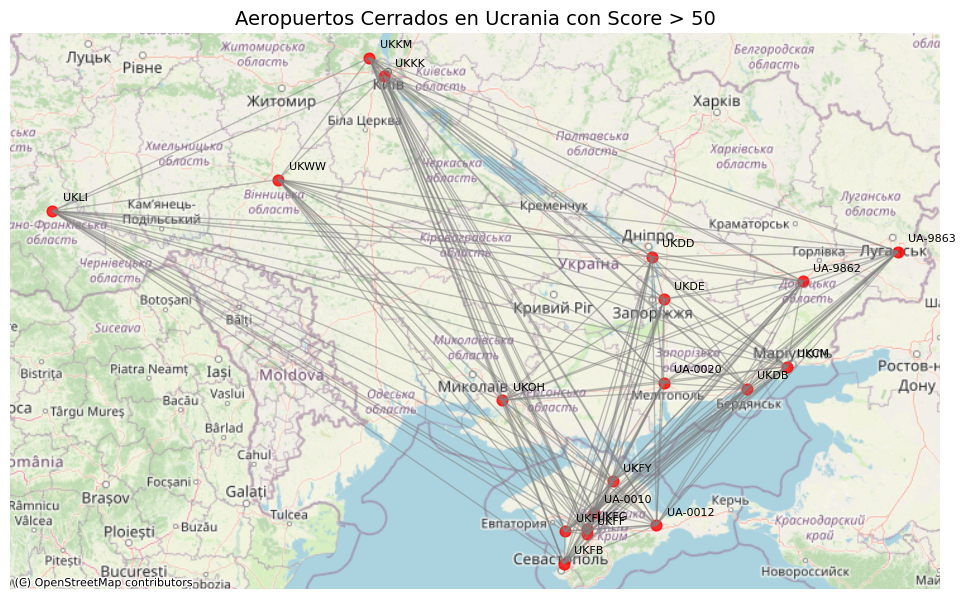

In [14]:
# 1. Filtrar aeropuertos cerrados con score > 50
closed_df = df[(df['type'] == 'closed') & (df['score'] > 50)].copy()

# 2. Crear geometría de puntos
closed_df['geometry'] = [Point(xy) for xy in zip(closed_df['longitude_deg'], closed_df['latitude_deg'])]
gdf_closed = gpd.GeoDataFrame(closed_df, geometry='geometry', crs='EPSG:4326')

# 3. Crear líneas entre pares de nodos
edges = []
for (i, row1), (j, row2) in combinations(gdf_closed.iterrows(), 2):
    point1 = row1['geometry']
    point2 = row2['geometry']
    line = LineString([point1, point2])
    edges.append({'source': row1['ident'], 'target': row2['ident'], 'geometry': line})

# 4. Convertir a GeoDataFrame
gdf_edges = gpd.GeoDataFrame(edges, geometry='geometry', crs='EPSG:4326')

# 5. Proyección a Web Mercator
gdf_closed_web = gdf_closed.to_crs(epsg=3857)
gdf_edges_web = gdf_edges.to_crs(epsg=3857)

# 6. Dibujar mapa
fig, ax = plt.subplots(figsize=(12, 14))

# Líneas
gdf_edges_web.plot(ax=ax, color='gray', linewidth=1, alpha=0.5)

# Nodos
gdf_closed_web.plot(ax=ax, color='red', markersize=60, alpha=0.8)

# Etiquetas
for x, y, label in zip(gdf_closed_web.geometry.x, gdf_closed_web.geometry.y, gdf_closed_web['ident']):
    ax.text(x + 20000, y + 20000, label, fontsize=8)

# Mapa base
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

# Título
plt.title("Aeropuertos Cerrados en Ucrania con Score > 50", fontsize=14)
plt.axis('off')
plt.show()

### ✈️ Visualización de aeropuertos cerrados en Ucrania con score superior a 50

Este segmento de código produce un **mapa de red geográfica** centrado en los aeropuertos ucranianos cerrados cuya importancia estratégica (representada por `score`) supera el umbral de 50. Esta visualización permite estudiar posibles **infraestructuras críticas altamente relevantes** que han sido clausuradas o afectadas en el contexto del conflicto.

#### 🔎 Explicación paso a paso:

1. **Filtrado de aeropuertos cerrados más relevantes:**
   Se seleccionan únicamente aquellos aeropuertos que cumplen dos condiciones:
   - Tipo: `'closed'`, es decir, ya no operativos.
   - `score > 50`, lo cual sugiere una mayor significancia militar, logística o política.

   Este umbral más elevado filtra los nodos menos relevantes, centrando la visualización en aquellos con mayor peso dentro de la red.

2. **Construcción de geometría de puntos:**
   Se convierten las coordenadas de latitud y longitud en objetos `Point` de `shapely`, para poder graficarlos y analizarlos espacialmente.

3. **Creación de líneas entre nodos seleccionados:**
   Se generan todas las combinaciones posibles de pares de aeropuertos seleccionados. Entre cada par, se traza una línea recta (`LineString`) que puede interpretarse como una **ruta potencial**, una conexión histórica o una posible ruta logística.

4. **Conversión de líneas a `GeoDataFrame`:**
   Las conexiones creadas se almacenan en un nuevo `GeoDataFrame`, con campos `source` y `target` que identifican los aeropuertos conectados, junto con su geometría.

5. **Reproyección a Web Mercator (EPSG:3857):**
   Para integrar correctamente con un mapa base en línea (como OpenStreetMap), los datos se reproyectan desde WGS84 (EPSG:4326) a Web Mercator, permitiendo una visualización precisa sobre la cartografía mundial.

6. **Visualización final:**
   Se representa el grafo espacial sobre un mapa base mediante `matplotlib` y `contextily`:
   - **Líneas grises**: conexiones entre aeropuertos cerrados con `score > 50`.
   - **Puntos rojos**: ubicación de los aeropuertos filtrados.
   - **Etiquetas ICAO (`ident`)**: permiten reconocer individualmente cada nodo.
   - **Fondo cartográfico**: OpenStreetMap ofrece un contexto geográfico para evaluar la distribución territorial.

   El gráfico se titula *"Aeropuertos Cerrados en Ucrania con Score > 50"*, destacando la naturaleza selectiva del análisis.

#### 📌 ¿Qué aporta esta representación?

- **Enfoque estratégico**: Al elevar el umbral del `score`, se destacan aquellos aeropuertos con mayor impacto potencial en la red logística nacional.
- **Lectura geopolítica**: Permite observar si estos puntos se concentran en zonas fronterizas, estratégicas o previamente militarizadas.
- **Análisis de conectividad**: La visualización de conexiones sugiere cómo podrían haberse estructurado las rutas aéreas clave o cuál era el grado de interdependencia entre estos nodos antes de su cierre.

Esta herramienta visual combina el análisis espacial con principios de teoría de redes, contribuyendo a una comprensión territorial de los efectos de la guerra sobre la infraestructura crítica.

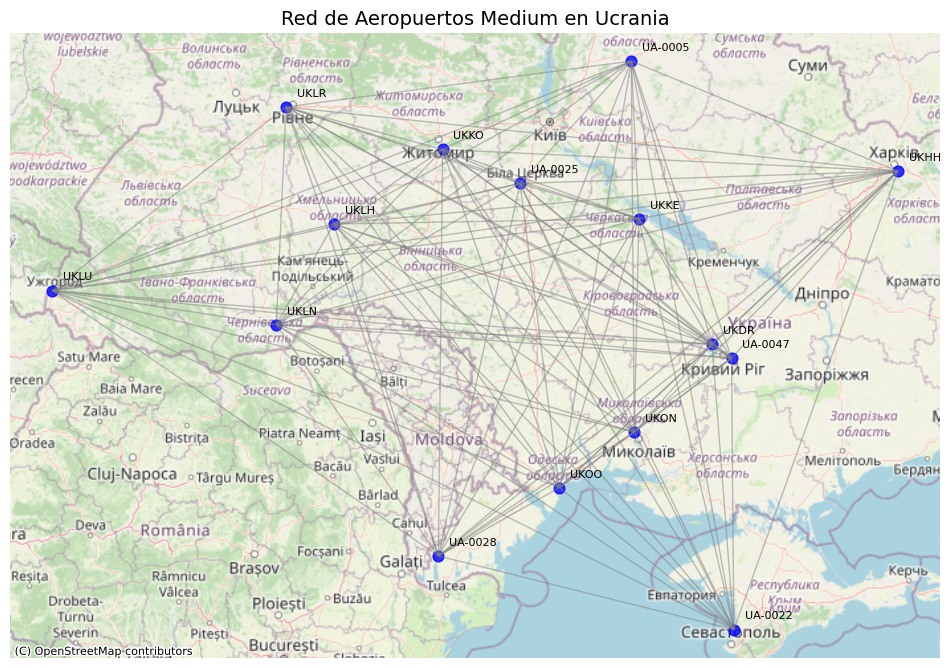

In [15]:
# 1. Filtrar aeropuertos tipo medium_airport
medium_df = df[df['type'] == 'medium_airport'].copy()

# 2. Crear geometría de puntos
medium_df['geometry'] = [Point(xy) for xy in zip(medium_df['longitude_deg'], medium_df['latitude_deg'])]
gdf_medium = gpd.GeoDataFrame(medium_df, geometry='geometry', crs='EPSG:4326')

# 3. Crear líneas entre pares de nodos
edges = []
for (i, row1), (j, row2) in combinations(gdf_medium.iterrows(), 2):
    point1 = row1['geometry']
    point2 = row2['geometry']
    line = LineString([point1, point2])
    edges.append({'source': row1['ident'], 'target': row2['ident'], 'geometry': line})

# 4. Convertir a GeoDataFrame
gdf_edges = gpd.GeoDataFrame(edges, geometry='geometry', crs='EPSG:4326')

# 5. Proyección a Web Mercator
gdf_medium_web = gdf_medium.to_crs(epsg=3857)
gdf_edges_web = gdf_edges.to_crs(epsg=3857)

# 6. Dibujar mapa
fig, ax = plt.subplots(figsize=(12, 14))

# Líneas
gdf_edges_web.plot(ax=ax, color='gray', linewidth=1, alpha=0.5)

# Nodos
gdf_medium_web.plot(ax=ax, color='blue', markersize=60, alpha=0.8)

# Etiquetas
for x, y, label in zip(gdf_medium_web.geometry.x, gdf_medium_web.geometry.y, gdf_medium_web['ident']):
    ax.text(x + 20000, y + 20000, label, fontsize=8)

# Mapa base
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

# Título
plt.title("Red de Aeropuertos Medium en Ucrania", fontsize=14)
plt.axis('off')
plt.show()

## 🛫 Visualización de la red de aeropuertos medianos (`medium_airport`) en Ucrania

Este bloque de código tiene como objetivo construir una **red espacial de conexiones entre aeropuertos medianos** en Ucrania, es decir, aquellos clasificados como `medium_airport` en el dataset, los cuales suelen tener una **relevancia regional** tanto en términos comerciales como estratégicos.

#### 🔍 Descripción del procedimiento:

1. **Filtrado de aeropuertos medianos:**
   Se seleccionan exclusivamente aquellos aeropuertos cuyo campo `type` es igual a `'medium_airport'`. Esta categoría normalmente incluye terminales con vuelos regulares o de importancia regional, que pueden servir como hubs secundarios.

2. **Generación de geometría geográfica:**
   A partir de las coordenadas de longitud y latitud, se generan objetos `Point` para representar la ubicación de cada aeropuerto sobre el espacio geográfico. Esta geometría se utiliza para crear una red de conexiones espaciales.

3. **Creación de líneas entre aeropuertos:**
   Se genera una **conexión hipotética entre cada par de aeropuertos** (todas las combinaciones posibles) usando líneas rectas (`LineString`). Estas conexiones permiten estudiar la **potencial malla de rutas** o interacciones geográficas entre los nodos de la red.

4. **Conversión a `GeoDataFrame`:**
   Las conexiones generadas se almacenan en un `GeoDataFrame` con tres columnas: `source` (aeropuerto origen), `target` (aeropuerto destino) y `geometry` (la línea de conexión entre ambos).

5. **Reproyección a Web Mercator (`EPSG:3857`):**
   Para que las geometrías sean compatibles con mapas base como OpenStreetMap, se reproyectan los datos al sistema de coordenadas Web Mercator, el estándar para visualizaciones web.

6. **Visualización de la red:**
   Se dibuja un mapa en `matplotlib` donde:
   - Las **líneas grises** representan las conexiones entre aeropuertos medianos.
   - Los **puntos azules** son los aeropuertos (`medium_airport`) localizados espacialmente.
   - Cada aeropuerto lleva su etiqueta ICAO (`ident`) desplazada ligeramente para evitar sobreposición.
   - Se incorpora un **mapa base** usando `contextily` con datos de OpenStreetMap, lo que permite contextualizar geográficamente la red.
   - Se añade un título descriptivo al gráfico: *"Red de Aeropuertos Medium en Ucrania"*.

#### 🎯 ¿Qué valor aporta esta visualización?

- Permite identificar **centros regionales clave** dentro del sistema aeroportuario ucraniano.
- Visualiza cómo están **distribuidos y conectados** estos nodos medianos, lo que puede ser útil en análisis de movilidad, logística y resiliencia de infraestructuras.
- Puede ser contrastada con la red de aeropuertos grandes (`large_airport`) o cerrados (`closed`) para observar diferencias estructurales, estratégicas o espaciales.

En conjunto, esta visualización forma parte de un análisis más amplio que combina geografía, redes e infraestructura crítica, especialmente relevante en contextos de guerra o recuperación post-conflicto.

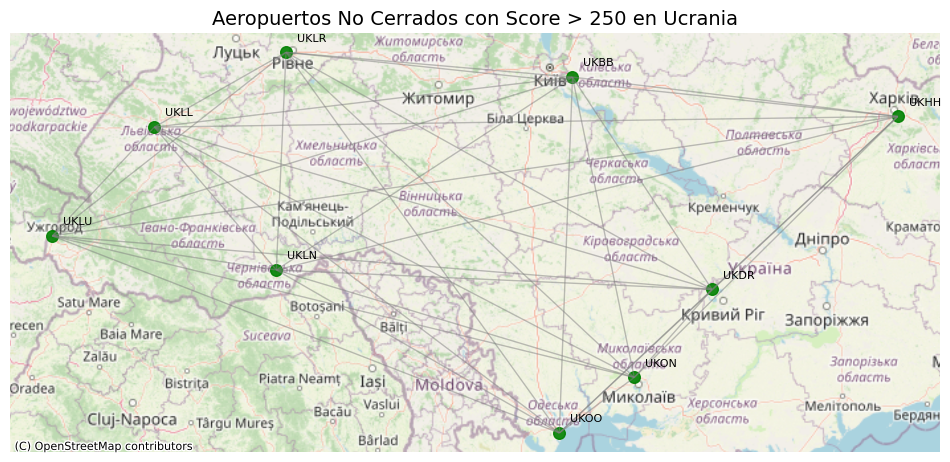

In [16]:
# 1. Filtrar aeropuertos que NO están cerrados y tienen score > 250
filtered_df = df[(df['type'] != 'closed') & (df['score'] > 250)].copy()

# 2. Crear geometría de puntos
filtered_df['geometry'] = [Point(xy) for xy in zip(filtered_df['longitude_deg'], filtered_df['latitude_deg'])]
gdf_open = gpd.GeoDataFrame(filtered_df, geometry='geometry', crs='EPSG:4326')

# 3. Crear líneas entre pares de nodos
edges = []
for (i, row1), (j, row2) in combinations(gdf_open.iterrows(), 2):
    point1 = row1['geometry']
    point2 = row2['geometry']
    line = LineString([point1, point2])
    edges.append({'source': row1['ident'], 'target': row2['ident'], 'geometry': line})

# 4. Convertir a GeoDataFrame
gdf_edges = gpd.GeoDataFrame(edges, geometry='geometry', crs='EPSG:4326')

# 5. Proyección a Web Mercator
gdf_open_web = gdf_open.to_crs(epsg=3857)
gdf_edges_web = gdf_edges.to_crs(epsg=3857)

# 6. Dibujar mapa
fig, ax = plt.subplots(figsize=(12, 14))

# Líneas
gdf_edges_web.plot(ax=ax, color='gray', linewidth=1, alpha=0.5)

# Nodos abiertos con score > 250
gdf_open_web.plot(ax=ax, color='green', markersize=70, alpha=0.9)

# Etiquetas de nodos
for x, y, label in zip(gdf_open_web.geometry.x, gdf_open_web.geometry.y, gdf_open_web['ident']):
    ax.text(x + 20000, y + 20000, label, fontsize=8)

# Mapa base
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

# Título
plt.title("Aeropuertos No Cerrados con Score > 250 en Ucrania", fontsize=14)
plt.axis('off')
plt.show()

### ✈️ Visualización de Aeropuertos Activos con Alta Importancia en Ucrania

Este bloque de código genera un **mapa de los aeropuertos activos** (es decir, que **no están cerrados**) y que tienen un **score mayor a 250**, lo cual podría interpretarse como un **índice de relevancia o actividad** (por ejemplo, cantidad de vuelos, conectividad, valor estratégico, etc.).

#### 🧭 Procedimiento detallado

1. **Filtrado de aeropuertos estratégicos:**
   Se seleccionan únicamente aquellos aeropuertos que cumplen dos condiciones:
   - No están cerrados (`type != 'closed'`).
   - Tienen un `score` mayor a 250.
   
   > Este paso permite focalizarse en aeropuertos que están operativos y cumplen un rol relevante dentro del sistema nacional.

2. **Generación de geometría:**
   Se construyen objetos `Point` a partir de la longitud y latitud para representar gráficamente la ubicación de cada aeropuerto.

3. **Creación de conexiones espaciales (líneas):**
   Se construyen **líneas entre todos los pares posibles** de aeropuertos filtrados. Cada línea representa una posible conexión directa (hipotética) entre dos nodos aeroportuarios, generando una red densa de interacciones.

   - Cada línea se guarda con información de `source`, `target` y `geometry`, lo que facilita posteriores análisis de red o visualización.

4. **Conversión a `GeoDataFrame`:**
   La lista de líneas se convierte en un `GeoDataFrame` compatible con operaciones espaciales y visualización.

5. **Proyección a Web Mercator (`EPSG:3857`):**
   Tanto los puntos (nodos) como las líneas (conexiones) se reproyectan a un sistema de coordenadas compatible con mapas base como OpenStreetMap.

6. **Visualización del mapa:**
   - Se crean las figuras con `matplotlib`.
   - Se dibujan las líneas grises representando las conexiones entre los aeropuertos estratégicos.
   - Los puntos verdes representan cada aeropuerto activo con `score > 250`.
   - Se etiquetan con el código `ident` para identificación.
   - Se añade un mapa base con `contextily` para dar contexto geográfico.

#### 📌 Resultado esperado

Un mapa titulado **"Aeropuertos No Cerrados con Score > 250 en Ucrania"**, donde se destaca:

- Una **red densa de conexiones entre aeropuertos estratégicos**.
- La **distribución espacial de nodos activos**, lo que puede ser útil para evaluar cobertura nacional, regiones clave o vulnerabilidades logísticas.

#### 🔍 ¿Por qué este mapa es importante?

- Permite visualizar los **nodos aeroportuarios más importantes en términos operativos o estratégicos**.
- Es útil en contextos como:
  - **Análisis de infraestructura crítica en tiempos de guerra.**
  - **Planeamiento logístico y militar.**
  - **Estudios de resiliencia del sistema de transporte aéreo.**
- Posibilita comparaciones con otras redes (como aeropuertos cerrados, pequeños o grandes) para observar patrones de conectividad y geopolítica territorial.


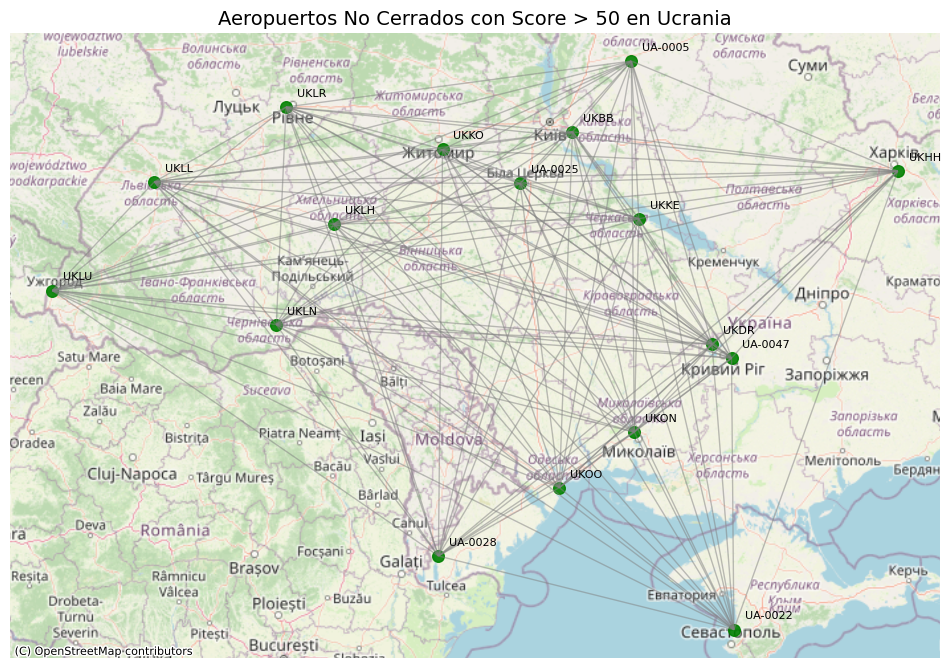

In [17]:
# 1. Filtrar aeropuertos que NO están cerrados y tienen score > 50
filtered_df = df[(df['type'] != 'closed') & (df['score'] > 50)].copy()

# 2. Crear geometría de puntos
filtered_df['geometry'] = [Point(xy) for xy in zip(filtered_df['longitude_deg'], filtered_df['latitude_deg'])]
gdf_open = gpd.GeoDataFrame(filtered_df, geometry='geometry', crs='EPSG:4326')

# 3. Crear líneas entre pares de nodos
edges = []
for (i, row1), (j, row2) in combinations(gdf_open.iterrows(), 2):
    point1 = row1['geometry']
    point2 = row2['geometry']
    line = LineString([point1, point2])
    edges.append({'source': row1['ident'], 'target': row2['ident'], 'geometry': line})

# 4. Convertir a GeoDataFrame
gdf_edges = gpd.GeoDataFrame(edges, geometry='geometry', crs='EPSG:4326')

# 5. Proyección a Web Mercator
gdf_open_web = gdf_open.to_crs(epsg=3857)
gdf_edges_web = gdf_edges.to_crs(epsg=3857)

# 6. Dibujar mapa
fig, ax = plt.subplots(figsize=(12, 14))

# Líneas entre aeropuertos
gdf_edges_web.plot(ax=ax, color='gray', linewidth=1, alpha=0.5)

# Nodos
gdf_open_web.plot(ax=ax, color='green', markersize=70, alpha=0.9)

# Etiquetas de nodos
for x, y, label in zip(gdf_open_web.geometry.x, gdf_open_web.geometry.y, gdf_open_web['ident']):
    ax.text(x + 20000, y + 20000, label, fontsize=8)

# Mapa base
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

# Título
plt.title("Aeropuertos No Cerrados con Score > 50 en Ucrania", fontsize=14)
plt.axis('off')
plt.show()

## 🚂 Ferrocarriles en el análisis de aeropuertos

Incluir los **ferrocarriles** en el análisis no solo complementa la visión aérea del territorio, sino que **amplía el entendimiento de toda la red logística y de transporte del país**, especialmente en contextos estratégicos como el de Ucrania.

---

### 1. 📦 Complementariedad de medios de transporte

- Los **aeropuertos** permiten conectar grandes distancias con rapidez, pero **no todos los bienes ni personas viajan por aire**.
- Los **ferrocarriles son ideales para el transporte masivo y pesado**, especialmente dentro del país y en zonas donde el acceso aéreo es limitado.

> ➕ Aeropuertos = velocidad  
> ➕ Ferrocarriles = capacidad de carga y territorialidad

---

### 2. 🗺️ Cobertura territorial y resiliencia

- Muchas ciudades o zonas rurales **no tienen aeropuertos activos**, pero sí están conectadas a la red ferroviaria.
- Analizar ambos sistemas permite identificar **brechas logísticas o zonas vulnerables** sin respaldo alternativo de transporte.

> Ejemplo: si un aeropuerto es clausurado, ¿puede el tren asumir esa función?

---

### 3. 🔄 Interconectividad y movilidad multimodal

- Una red eficiente conecta **aeropuertos con estaciones de tren**, generando corredores logísticos integrados.
- Permite optimizar el transporte de personas y mercancías en esquemas multimodales.

> Como en Europa: llegas en avión y conectas con tren de alta velocidad hasta tu destino.

---

### 4. 🛡️ Análisis de vulnerabilidades y defensa

- En contextos de guerra o desastre natural, se necesita una **visión completa de cómo mover recursos**.
- Las redes ferroviarias son frecuentemente consideradas **infraestructura crítica** y objetivo militar.

> Conocer su relación con los aeropuertos ayuda a identificar cuellos de botella y alternativas estratégicas.

---

### 5. 🔗 Modelos de red y eficiencia logística

- El análisis conjunto permite:
  - Medir **conectividad nacional total**.
  - Calcular rutas óptimas combinando tren + avión.
  - Identificar nodos estratégicos que concentren ambos tipos de transporte.

---

### 6. 🏛️ Política pública y planificación

- Gobiernos y organismos priorizan **nodos intermodales** (aeropuerto + estación + carretera).
- Este análisis puede guiar **decisiones de inversión, reconstrucción y desarrollo sostenible**.

---

### ✅ Conclusión

Incorporar ferrocarriles al análisis de aeropuertos:
- Cierra el mapa logístico del país.
- Enriquece el diagnóstico territorial.
- Mejora la toma de decisiones en contextos de crisis, planificación o competencia geopolítica.



In [18]:
from google.colab import files
uploaded = files.upload()

Saving hotosm_ukr_railways_lines_shp.zip to hotosm_ukr_railways_lines_shp.zip


In [19]:
import zipfile
import os

with zipfile.ZipFile("hotosm_ukr_railways_lines_shp.zip", "r") as zip_ref:
    zip_ref.extractall("railways_data")

In [20]:
# Leer shapefile con nombre completo y correcto
railways = gpd.read_file("railways_data/hotosm_ukr_railways_lines_shp.shp")

# Proyectar al mismo CRS que tu mapa (Web Mercator)
railways = railways.to_crs(epsg=3857)

# Verificar contenido
railways.head()

,name,name_en,railway,ele,operator_t,layer,addr_full,addr_city,source,name_uk,osm_id,osm_type,geometry
0,None,None,rail,None,None,None,None,None,None,None,909550098,ways_line,"LINESTRING (3171694.126 6320023.646, 3171639.7..."
1,None,None,rail,None,None,None,None,None,None,None,725678240,ways_line,"LINESTRING (3614663.156 5994502.534, 3614623.5..."
2,None,None,rail,None,None,None,None,None,None,None,696890387,ways_line,"LINESTRING (2477458.181 6205014.829, 2477516.1..."
3,None,None,rail,None,None,None,None,None,None,None,477228096,ways_line,"LINESTRING (2472812.708 6179274.18, 2472828.79..."
4,None,None,rail,None,None,None,None,None,None,None,477228104,ways_line,"LINESTRING (2472871.774 6179191.482, 2472902.4..."


## 🚄 Características de la capa de ferrocarriles de Ucrania

La capa utilizada para representar las **líneas ferroviarias** en Ucrania proviene del conjunto de datos proporcionado por **HOTOSM (Humanitarian OpenStreetMap Team)**. Esta capa está contenida en el archivo shapefile llamado:

---

### 🧩 Descripción de la estructura de los datos

El archivo incluye información vectorial en formato `LINESTRING`, correspondiente a trazos de líneas ferroviarias. Entre las columnas más relevantes que contiene la tabla de atributos se encuentran:

| Columna       | Descripción                                                       |
|---------------|-------------------------------------------------------------------|
| `name`        | Nombre del tramo ferroviario (muchos están vacíos)                |
| `railway`     | Tipo de infraestructura ferroviaria (en este caso, `rail`)        |
| `geometry`    | Representación geométrica del trazo (tipo `LINESTRING`)           |
| `osm_id`      | Identificador único del objeto en OpenStreetMap                   |
| `osm_type`    | Tipo de entidad (por ejemplo, `ways_line`)                        |
| `ele`         | Elevación (valor nulo en la mayoría de registros)                 |
| `operator`    | Entidad operadora (valor nulo)                                    |
| `addr_full`   | Dirección completa (mayoría nulo)                                 |
| `addr_city`   | Ciudad asociada al tramo (mayoría nulo)                           |
| `name_en`     | Nombre del tramo en inglés (vacío)                                |
| `source`      | Fuente de los datos (vacío)                                       |
| `name_uk`     | Nombre en ucraniano (vacío)                                       |

> ⚠️ **Nota:** La mayoría de los atributos no contienen información descriptiva detallada. Sin embargo, la geometría es suficiente para realizar un análisis espacial y geográfico.

---

### 🌍 Proyección y compatibilidad

- La capa fue reproyectada al sistema de coordenadas **Web Mercator (EPSG:3857)** para asegurar compatibilidad con las otras capas utilizadas en el análisis (como aeropuertos y mapa base de OpenStreetMap).

# Lectura y proyección
railways = gpd.read_file("railways_data/hotosm_ukr_railways_lines_shp.shp")
railways = railways.to_crs(epsg=3857)

In [21]:
railways.plot(ax=ax, color='black', linewidth=1.2, alpha=0.6, label='Ferrocarriles')

<Axes: title={'center': 'Aeropuertos No Cerrados con Score > 50 en Ucrania'}>

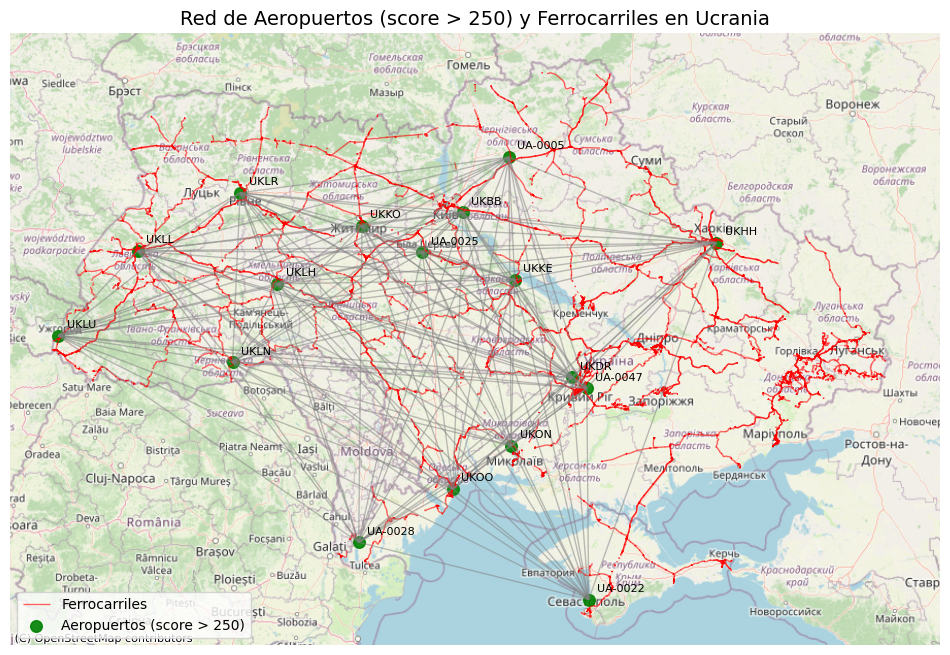

In [22]:
# 1. Leer shapefile de ferrocarriles y reproyectar
railways = gpd.read_file("railways_data/hotosm_ukr_railways_lines_shp.shp")
railways = railways.to_crs(epsg=3857)

# 2. Crear el mapa
fig, ax = plt.subplots(figsize=(12, 14))

# Dibujar ferrocarriles
railways.plot(ax=ax, color='red', linewidth=1.0, alpha=0.6, label='Ferrocarriles')

# Dibujar las conexiones entre aeropuertos
gdf_edges_web.plot(ax=ax, color='gray', linewidth=1, alpha=0.5)

# Dibujar los aeropuertos abiertos con score > 250
gdf_open_web.plot(ax=ax, color='green', markersize=70, alpha=0.9, label='Aeropuertos (score > 250)')

# Etiquetas de los aeropuertos
for x, y, label in zip(gdf_open_web.geometry.x, gdf_open_web.geometry.y, gdf_open_web['ident']):
    ax.text(x + 20000, y + 20000, label, fontsize=8)

# Agregar mapa base
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

# Configurar título y leyenda
plt.title("Red de Aeropuertos (score > 250) y Ferrocarriles en Ucrania", fontsize=14)
plt.axis('off')
plt.legend(loc='lower left')
plt.show()

## 🗺️ Visualización conjunta: Aeropuertos y Ferrocarriles en Ucrania

A continuación se presenta el código para visualizar en un mismo mapa interactivo tres capas fundamentales de infraestructura en Ucrania:

- Aeropuertos abiertos con un `score > 250`
- Líneas de conexión entre aeropuertos (gdf_edges_web)
- Red de ferrocarriles nacionales (vía shapefile)

---

### 🧪 Código explicado paso a paso

**Lectura del shapefile y proyección:**

Primero se carga el shapefile que contiene las líneas ferroviarias desde una carpeta local. Luego, se reproyecta al sistema de coordenadas EPSG:3857 (Web Mercator), que es el utilizado por la mayoría de los mapas base en línea como OpenStreetMap. Esto garantiza la alineación correcta entre las capas geográficas y el mapa base.

---

**Creación del lienzo de visualización:**

Se crea una figura (`fig`) y un eje (`ax`) donde se van a dibujar todas las capas. El tamaño del lienzo se define de modo que el mapa tenga buena resolución y permita observar con claridad las conexiones y los elementos geográficos.

---

**Dibujo de las líneas ferroviarias:**

Se representa la red ferroviaria en color rojo, con un grosor medio y cierto nivel de transparencia (`alpha=0.6`). Esto permite que no opaque el mapa base ni otras capas. La elección del rojo ayuda a destacar visualmente la infraestructura ferroviaria sobre el fondo.

---

**Representación de conexiones aéreas:**

Luego, se dibujan las líneas que representan las conexiones entre los aeropuertos. Estas conexiones fueron probablemente generadas con NetworkX como edges entre nodos. Se muestran en color gris tenue, con un trazo más fino y mayor transparencia (`alpha=0.5`) para no saturar visualmente el mapa.

---

**Visualización de aeropuertos abiertos:**

Los aeropuertos abiertos con un `score > 250` se muestran en verde intenso, con un tamaño de marcador mayor (`markersize=70`) y una opacidad más alta. Esto permite que estos nodos sean fácilmente identificables como elementos prioritarios de la red.

---

**Adición de etiquetas a los aeropuertos:**

Cada aeropuerto es etiquetado con su identificador (`ident`). Las etiquetas se colocan ligeramente desplazadas hacia la derecha y arriba respecto a su ubicación para evitar que se superpongan con los puntos. Esta práctica es clave en mapas densos, donde la legibilidad es fundamental.

---

**Incorporación de un mapa base:**

Para mejorar la lectura espacial del gráfico, se añade un mapa base de OpenStreetMap utilizando la librería `contextily`. Este mapa de fondo permite ubicar los elementos sobre un entorno geográfico real (carreteras, ciudades, límites), facilitando el análisis territorial.

---

**Configuración final del mapa:**

Finalmente, se añade un título general al gráfico, se desactiva la visualización de ejes para enfocarse solo en el contenido geográfico, se incluye una leyenda que describe cada capa, y se muestra el resultado.

---

### 📌 Resultado

Este mapa proporciona una visión integrada de la infraestructura de transporte en Ucrania, destacando los puntos nodales más importantes (aeropuertos relevantes) y las redes que los conectan (vías férreas y rutas aéreas).

Permite responder a preguntas como:
- ¿Qué tan accesibles son los aeropuertos estratégicos por vía terrestre?
- ¿Dónde se cruzan o complementan las redes ferroviarias y aéreas?
- ¿Existen regiones que carecen de acceso a ambas infraestructuras?

Este tipo de análisis visual es esencial para estudios de logística, planeamiento estratégico, desarrollo territorial y análisis de vulnerabilidad en contextos de emergencia o conflicto.

In [23]:
from shapely.geometry import Point

# 1. Crear un buffer de 10 km (10000 m) alrededor de las líneas de ferrocarril
railways_buffer = railways.buffer(10000)

# 2. Unir todos los buffers en un solo objeto para facilitar el análisis
railways_union = railways_buffer.unary_union

# 3. Filtrar los aeropuertos que están dentro del buffer (o sea, cerca de ferrocarriles)
gdf_priority = gdf_open_web[gdf_open_web.geometry.within(railways_union)].copy()

/tmp/ipython-input-23-2342832669.py:7: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  railways_union = railways_buffer.unary_union


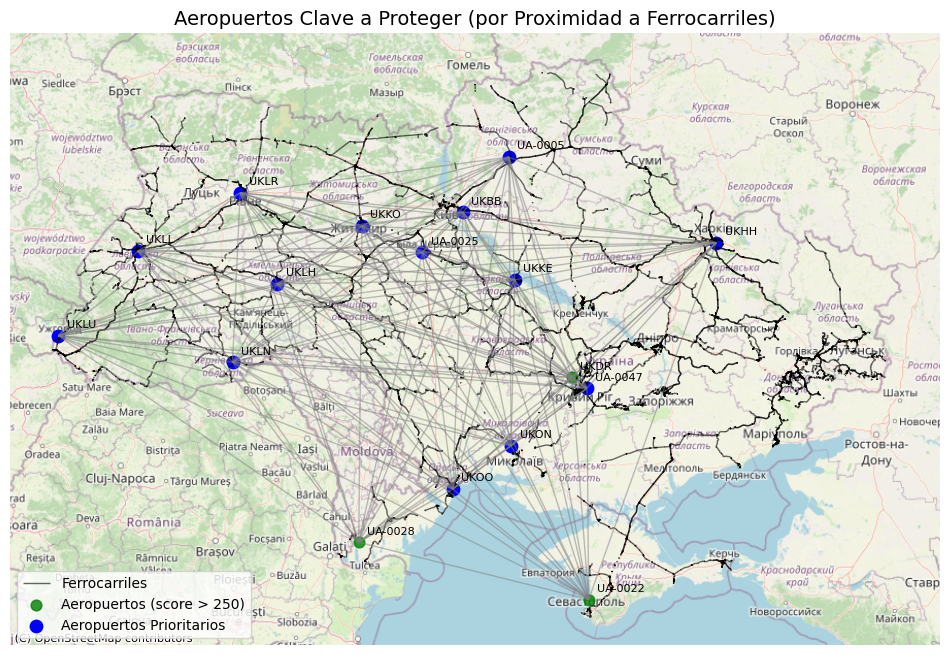

In [24]:
# Crear el mapa
fig, ax = plt.subplots(figsize=(12, 14))

# Ferrocarriles
railways.plot(ax=ax, color='black', linewidth=1.0, alpha=0.6, label='Ferrocarriles')

# Conexiones
gdf_edges_web.plot(ax=ax, color='gray', linewidth=1, alpha=0.5)

# Aeropuertos normales (score > 250)
gdf_open_web.plot(ax=ax, color='green', markersize=60, alpha=0.8, label='Aeropuertos (score > 250)')

# Aeropuertos prioritarios (score > 250 y cerca de ferrocarril)
gdf_priority.plot(ax=ax, color='blue', markersize=80, alpha=1, label='Aeropuertos Prioritarios')

# Etiquetas
for x, y, label in zip(gdf_open_web.geometry.x, gdf_open_web.geometry.y, gdf_open_web['ident']):
    ax.text(x + 20000, y + 20000, label, fontsize=8)

# Mapa base
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

# Título y leyenda
plt.title("Aeropuertos Clave a Proteger (por Proximidad a Ferrocarriles)", fontsize=14)
plt.axis('off')
plt.legend(loc='lower left')
plt.show()

### Análisis Espacial de Aeropuertos Cercanos a Ferrocarriles

Una vez identificados los aeropuertos abiertos con un **puntaje superior a 250**, el siguiente paso estratégico consistió en analizar su **proximidad a la red ferroviaria**. Esto resulta crucial porque la **interconectividad modal** (aérea y terrestre) fortalece la resiliencia logística de un país en escenarios de conflicto o emergencia.

#### Creación de un buffer de influencia ferroviaria

Para determinar qué aeropuertos son prioritarios por estar **cerca de las vías férreas**, se aplicó un enfoque espacial:

1. Se construyó un **buffer de 10 km** alrededor de todas las líneas de ferrocarril de Ucrania. Este margen es una medida razonable para considerar una conectividad terrestre directa o potencialmente desarrollable.

2. Los múltiples buffers generados fueron **unidos en una sola geometría**, permitiendo verificar si los aeropuertos caen dentro de esta zona de influencia.

3. Se filtraron los aeropuertos que se encuentran **dentro del buffer ferroviario**, es decir, aquellos que tienen un vínculo geográfico cercano con una vía férrea existente.

#### Visualización de la infraestructura integrada

Para reforzar el análisis, se generaron dos mapas clave:

- El **primer mapa** muestra la red de ferrocarriles y los aeropuertos abiertos con score alto, visualizando todas las conexiones posibles entre ellos. Esto permite tener una visión general del sistema de transporte nacional y sus puntos críticos.

- El **segundo mapa** resalta en color azul los **aeropuertos prioritarios**: aquellos que cumplen con dos condiciones:
  - Están abiertos y con **score > 250**.
  - Se encuentran **a menos de 10 km de una línea ferroviaria**.

Esta visualización integrada permite identificar **infraestructura clave a proteger, restaurar o reforzar**, dado que podrían ser puntos estratégicos de entrada de ayuda humanitaria, logística militar o evacuación civil.

#### Importancia de este análisis

- **Interoperabilidad modal**: La combinación de transporte aéreo y ferroviario es fundamental en escenarios de conflicto, ya que permite rutas alternas en caso de ataques a pistas o aeródromos.

- **Reducción de costos logísticos**: Los aeropuertos cercanos a ferrocarriles pueden facilitar el transporte interregional eficiente sin depender completamente de las carreteras, muchas de las cuales están expuestas o deterioradas en tiempos de guerra.

- **Priorización de inversiones y defensa**: Este enfoque permite jerarquizar qué infraestructura restaurar primero o dónde desplegar recursos militares o humanitarios, maximizando el impacto con recursos limitados.

En conjunto, este paso permite pasar de un simple listado de instalaciones a una comprensión territorial más fina, identificando **corredores logísticos estratégicos** para la operación del país.

In [25]:
# 1. Crear buffer alrededor de cada línea ferroviaria (por ejemplo 900 km)
railways['buffer'] = railways.geometry.buffer(900000)

# 2. Contar cuántos aeropuertos con score > 250 hay dentro del buffer de cada línea
airport_points = gdf_open_web.copy()
railways['airport_count'] = railways['buffer'].apply(lambda buf: airport_points.geometry.within(buf).sum())

# 3. Eliminar la columna de buffer (ya no se necesita)
railways.drop(columns='buffer', inplace=True)

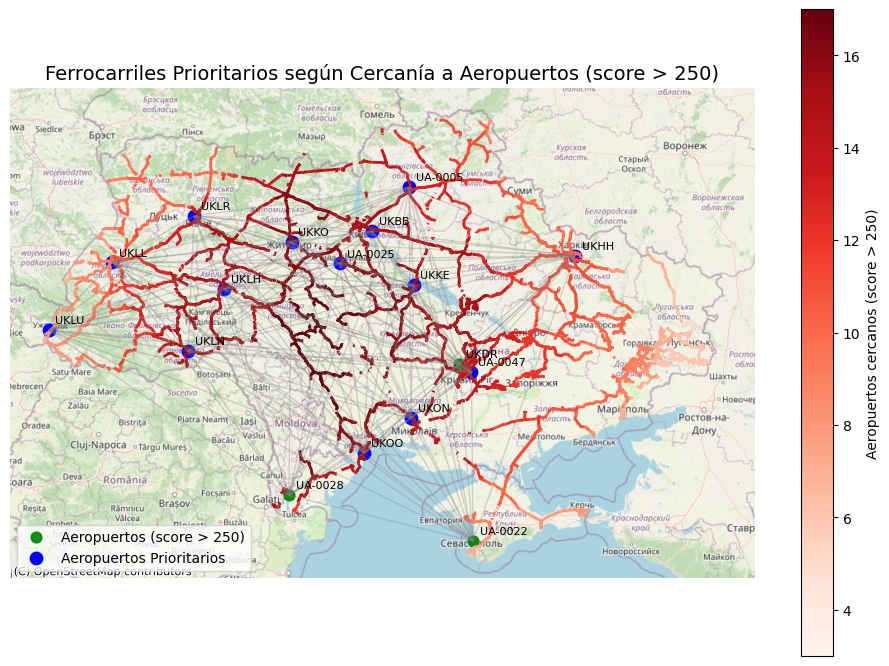

In [26]:
# Mapa
fig, ax = plt.subplots(figsize=(12, 14))

# 1. Dibujar líneas ferroviarias con color según cantidad de aeropuertos cercanos
railways.plot(ax=ax, column='airport_count', cmap='Reds', linewidth=2, legend=True,
              legend_kwds={'label': "Aeropuertos cercanos (score > 250)", 'shrink': 0.6})

# 2. Dibujar conexiones entre aeropuertos
gdf_edges_web.plot(ax=ax, color='gray', linewidth=1, alpha=0.3)

# 3. Aeropuertos
gdf_open_web.plot(ax=ax, color='green', markersize=60, alpha=0.9, label='Aeropuertos (score > 250)')

# 4. Aeropuertos prioritarios (cerca de ferrocarriles)
gdf_priority.plot(ax=ax, color='blue', markersize=80, alpha=1, label='Aeropuertos Prioritarios')

# Etiquetas de nodos
for x, y, label in zip(gdf_open_web.geometry.x, gdf_open_web.geometry.y, gdf_open_web['ident']):
    ax.text(x + 20000, y + 20000, label, fontsize=8)

# Fondo de mapa
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

# Título y leyenda
plt.title("Ferrocarriles Prioritarios según Cercanía a Aeropuertos (score > 250)", fontsize=14)
plt.axis('off')
plt.legend(loc='lower left')
plt.show()

### Identificación de Líneas Ferroviarias Estratégicas Según Proximidad a Aeropuertos Relevantes

#### Paso 1: Análisis de Proximidad entre Ferrocarriles y Aeropuertos

Para avanzar en la comprensión de los corredores logísticos integrados, se aplicó un análisis espacial que permite **cuantificar la relación entre la red ferroviaria y los aeropuertos clave** (aquellos con un score superior a 250 y que están operativos).

- Se creó un **buffer de 900 km alrededor de cada línea ferroviaria**. Esta distancia ampliada tiene un propósito metodológico: capturar grandes corredores ferroviarios y su interacción con el sistema aeroportuario a nivel nacional. Aunque puede parecer extensa, sirve para realizar un análisis comparativo general.

- A continuación, se **calculó cuántos aeropuertos relevantes están contenidos dentro del buffer de cada línea ferroviaria**. Esto se hizo contando los puntos (aeropuertos) que caen dentro de cada zona de influencia ferroviaria.

- Finalmente, se eliminó la columna de buffers temporales utilizada en el cálculo, dejando solo el conteo de aeropuertos como variable clave de análisis por cada línea ferroviaria.

Este conteo permite **jerarquizar las líneas ferroviarias** en función de su cercanía a infraestructuras aeroportuarias importantes, facilitando así la detección de rutas críticas para la logística multimodal.

---

#### Paso 2: Visualización Integrada en Mapa

El análisis fue complementado con un mapa temático que permite observar de manera clara las **relaciones espaciales entre ferrocarriles y aeropuertos estratégicos**. El mapa contiene los siguientes elementos:

1. **Líneas ferroviarias**, coloreadas de rojo claro a rojo oscuro, según el número de aeropuertos cercanos (score > 250). Esto permite visualizar qué tramos del ferrocarril tienen mayor conectividad con el sistema aeroportuario.

2. **Rutas de conexión entre aeropuertos**, representadas con líneas grises. Estas muestran las conexiones aéreas identificadas anteriormente, contribuyendo a visualizar la red como un sistema intermodal.

3. **Aeropuertos operativos con score alto**, marcados en verde, representan nodos logísticos relevantes.

4. **Aeropuertos prioritarios**, es decir, aquellos con alta puntuación y ubicados cerca de líneas ferroviarias, marcados en azul. Estos nodos son cruciales porque concentran capacidad aérea y acceso ferroviario directo.

5. **Etiquetas de identificación**, para facilitar la lectura de nodos clave en el mapa.

6. **Fondo cartográfico** de OpenStreetMap, que proporciona contexto geográfico para una mejor interpretación visual.

El título del mapa resalta el objetivo de este paso: identificar **líneas ferroviarias prioritarias según su cercanía a aeropuertos estratégicos**. Esta visualización final permite tomar decisiones más informadas sobre corredores logísticos clave en Ucrania.

---

#### Relevancia del Análisis

- Este enfoque ofrece una visión **integrada del transporte nacional**, revelando no solo qué nodos son importantes, sino **qué rutas permiten conectarlos eficientemente**.

- Permite **optimizar recursos para recuperación de infraestructura**, priorizando aquellas líneas férreas que vinculan múltiples aeropuertos clave.

- En contextos de guerra o crisis humanitaria, esta combinación es vital para **mantener la movilidad de bienes, personas y ayuda internacional** a través de medios alternativos.

Con este paso, se consolida un análisis territorial robusto que combina nodos, conexiones y redes de apoyo terrestre, contribuyendo a la resiliencia logística del país.

In [27]:
# 1. Filtrar aeropuertos cerrados (atacados)
df_closed = df[df['type'] == 'closed'].copy()

# 2. Crear geometría
df_closed['geometry'] = [Point(xy) for xy in zip(df_closed['longitude_deg'], df_closed['latitude_deg'])]

# 3. GeoDataFrame y proyección
gdf_closed = gpd.GeoDataFrame(df_closed, geometry='geometry', crs='EPSG:4326')
gdf_closed_web = gdf_closed.to_crs(epsg=3857)

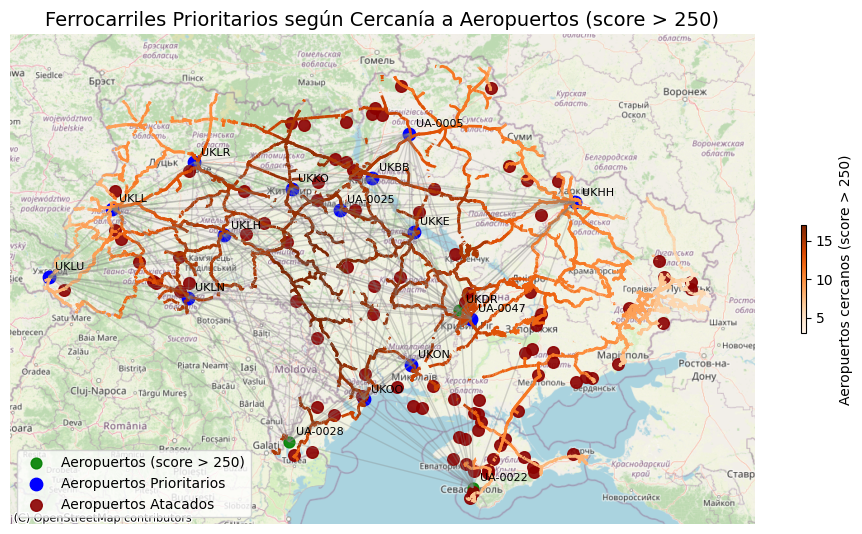

In [28]:
# Mapa
fig, ax = plt.subplots(figsize=(12, 14))

# 1. Dibujar líneas ferroviarias con color según cantidad de aeropuertos cercanos
railways.plot(ax=ax, column='airport_count', cmap='Oranges', linewidth=2, legend=True,
              legend_kwds={'label': "Aeropuertos cercanos (score > 250)", 'shrink': 0.1})

# 2. Dibujar conexiones entre aeropuertos
gdf_edges_web.plot(ax=ax, color='gray', linewidth=1, alpha=0.3)

# 3. Aeropuertos
gdf_open_web.plot(ax=ax, color='green', markersize=60, alpha=0.9, label='Aeropuertos (score > 250)')

# 4. Aeropuertos prioritarios (cerca de ferrocarriles)
gdf_priority.plot(ax=ax, color='blue', markersize=80, alpha=1, label='Aeropuertos Prioritarios')

# 5. Aeropuertos atacados (cerrados)
gdf_closed_web.plot(ax=ax, color='darkred', markersize=70, alpha=0.9, label='Aeropuertos Atacados')

# Etiquetas de nodos
for x, y, label in zip(gdf_open_web.geometry.x, gdf_open_web.geometry.y, gdf_open_web['ident']):
    ax.text(x + 20000, y + 20000, label, fontsize=8)

# Fondo de mapa
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

# Título y leyenda
plt.title("Ferrocarriles Prioritarios según Cercanía a Aeropuertos (score > 250)", fontsize=14)
plt.axis('off')
plt.legend(loc='lower left')
plt.show()

### Identificación de Líneas Ferroviarias Estratégicas Según Proximidad a Aeropuertos Relevantes

#### Paso 1: Análisis de Proximidad entre Ferrocarriles y Aeropuertos

Para avanzar en la comprensión de los corredores logísticos integrados, se aplicó un análisis espacial que permite **cuantificar la relación entre la red ferroviaria y los aeropuertos clave** (aquellos con un score superior a 250 y que están operativos).

- Se creó un **buffer de 900 km alrededor de cada línea ferroviaria**.
- Se **contaron los aeropuertos relevantes** contenidos dentro de cada buffer.
- Se eliminó el buffer temporal y se conservó el conteo por línea ferroviaria.

Este conteo permite **jerarquizar las líneas ferroviarias** según su proximidad a aeropuertos importantes.

---

#### Paso 2: Visualización Integrada en Mapa

El mapa contiene:

1. **Líneas ferroviarias**, coloreadas según número de aeropuertos cercanos.
2. **Conexiones aéreas** representadas en gris.
3. **Aeropuertos con alto score** (en verde).
4. **Aeropuertos prioritarios** (en azul).
5. **Aeropuertos atacados o cerrados** (en rojo oscuro).
6. **Etiquetas de nodos aeroportuarios clave**.
7. **Fondo cartográfico** de OpenStreetMap.

Este mapa permite identificar **corredores logísticos multimodales prioritarios**, útiles para planes de infraestructura, recuperación o ayuda humanitaria.

---

#### Relevancia del Análisis

- Proporciona una visión **intermodal** del sistema logístico nacional.
- Permite **priorizar la recuperación de infraestructura** crítica.
- Contribuye a la **resiliencia territorial** ante crisis humanitarias o conflictos.

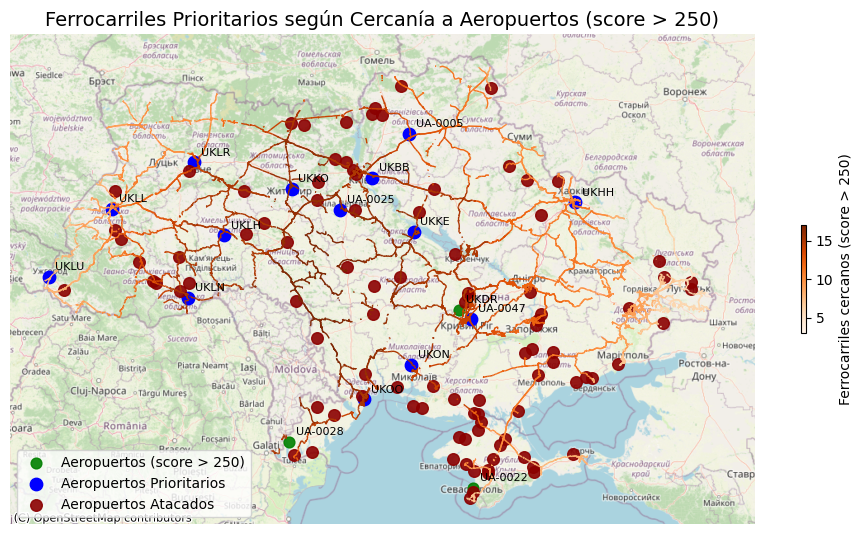

In [29]:
# Mapa
fig, ax = plt.subplots(figsize=(12, 14))

# 1. Dibujar líneas ferroviarias con color según cantidad de aeropuertos cercanos
railways.plot(ax=ax, column='airport_count', cmap='Oranges', linewidth=1, legend=True,
              legend_kwds={'label': "Ferrocarriles cercanos (score > 250)", 'shrink': 0.1})

# 3. Aeropuertos
gdf_open_web.plot(ax=ax, color='green', markersize=60, alpha=0.9, label='Aeropuertos (score > 250)')

# 4. Aeropuertos prioritarios (cerca de ferrocarriles)
gdf_priority.plot(ax=ax, color='blue', markersize=80, alpha=1, label='Aeropuertos Prioritarios')

# 5. Aeropuertos atacados (cerrados)
gdf_closed_web.plot(ax=ax, color='darkred', markersize=70, alpha=0.9, label='Aeropuertos Atacados')

# Etiquetas de nodos
for x, y, label in zip(gdf_open_web.geometry.x, gdf_open_web.geometry.y, gdf_open_web['ident']):
    ax.text(x + 20000, y + 20000, label, fontsize=8)

# Fondo de mapa
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

# Título y leyenda
plt.title("Ferrocarriles Prioritarios según Cercanía a Aeropuertos (score > 250)", fontsize=14)
plt.axis('off')
plt.legend(loc='lower left')
plt.show()

#### Paso 2: Visualización Integrada en Mapa

Se genera un mapa que representa las interacciones entre:

1. **Ferrocarriles**, coloreados según la cantidad de aeropuertos relevantes cercanos (score > 250).
2. **Aeropuertos operativos de alto puntaje**, representados en **verde**.
3. **Aeropuertos prioritarios**, es decir, los cercanos a ferrocarriles, en **azul**.
4. **Aeropuertos cerrados o atacados**, representados en **rojo oscuro**, lo que permite observar vulnerabilidades o pérdidas de conectividad aérea clave.

Además, se agregan etiquetas con los **identificadores de aeropuertos relevantes**, lo que facilita su análisis individual.

---

#### Importancia del Análisis

- Permite detectar **infraestructura aérea crítica actualmente fuera de servicio** y su relación con el sistema ferroviario.
- Ayuda a **identificar regiones con mayor riesgo logístico** debido a interrupciones en el transporte aéreo.
- Ofrece una base cartográfica para **priorizar la recuperación, defensa o asistencia** en contextos de emergencia o conflicto.
- Al integrar múltiples capas (ferrocarriles, aeropuertos abiertos, cerrados y prioritarios), se consigue una **visión integral del sistema intermodal**.

Este análisis fortalece la capacidad para diseñar estrategias logísticas resilientes, tanto en tiempos de paz como en contextos adversos.

## 🛰️ 4. Resultados y análisis

A la luz de los resultados obtenidos, se concluye que el ejército ruso ha irrumpido en la mayoría de la infraestructura aeroportuaria de Ucrania. Esta incursión **no se limita a zonas circundantes o próximas al frente del Donbás**. Al contrario, los aeropuertos vulnerados se distribuyen crecientemente en los óblast del oeste ucraniano, donde incluso se ha producido su inhabilitación (nomenclatura técnica: `closed`), evidenciando un **despliegue ofensivo generalizado** para neutralizar nodos logísticos clave.

Por un lado:

- Los aeropuertos de Lviv (UKLL) y Zakarpattia (UKLU) **no fueron arrasados** como en el Donbás.
- Se argumenta que esta moderación responde a evitar la escalada del conflicto y una eventual **intervención de la OTAN**, ya que estas infraestructuras están próximas a Polonia, Eslovaquia y Rumania (Cozard, Frederick y Stark, 2023).
- Estos corredores siguen bajo administración ucraniana, manteniendo su **potencial logístico**.

Por otro lado:

- Se observó que estos aeropuertos tienen **corredores ferroviarios funcionales cercanos**, lo cual permite su uso como nodos logísticos de:
  - Abastecimiento de armas por parte de aliados occidentales.
  - Transporte hacia el frente del Donbás.
- No obstante, **a diferencia de los aeropuertos**, las **redes ferroviarias sí son vulnerables a ataques directos**, lo que las convierte en eslabones frágiles.
- También se sugiere que su valor va más allá del ámbito bélico, sirviendo para:
  - Acopio de ayuda humanitaria.
  - Corredores de evacuación civil.

Además:

- Los óblast con **mayor concentración de aeropuertos destruidos** están en el **sureste ucraniano**: Dnipropetrovsk, Zaporizhia, Kherson, Donetsk, Luhansk.
- Esto es coherente con su proximidad a los principales frentes del conflicto.

Finalmente:

- En el centro-oeste y noroeste se identifican **aeropuertos prioritarios conectados por redes ferroviarias**, destacando la interconexión reconocida por la herramienta cuantitativa.
- Esta zona es vulnerable por su cercanía al óblast de Kyiv.
- En ella se ubican: Khmelnytsky (UKLH), Cherkasy (UKKE), Kyiv (UKBB), Rivne (UKLR) y Zhytomy (UKKO).
- UKKO es particularmente importante por albergar la **base aérea de Ozerne**, de origen soviético, utilizada por la Luftwaffe y atacada varias veces (Airports-Worldwide, 2020; Reuters, 2024).

---

## 🧭 5. Conclusiones

- El análisis de red evidencia una **infraestructura aeroportuaria interconectada**, que facilita la logística pero también implica **alta vulnerabilidad sistémica**.
- En el contexto de una guerra en intensificación (Psaropoulos, 2025; ISW, 2025), se debe:
  - **Proteger nodos multimodales clave**, especialmente aquellos con **aeropuertos + ferrocarriles**.
  - Reforzar corredores ferroviarios interconectados (Leópolis `UKLL`, Kiev `UKKK/UKKM`, Vinnytsia `UKWW`) mediante:
    - Vigilancia aérea.
    - Drones.
    - Defensa móvil antiaérea.
  - Establecer **planes de contingencia** para aeropuertos atacados con potencial logístico como:
    - Mykolaiv (UKON), Odesa (UKOO), Dnipró (UKDD).
  - Invertir en rutas alternas en zonas rurales (carreteras móviles, helipuertos temporales).
  - Consolidar una **red logística de respaldo oeste-centro** (Leópolis, Ternópil, Ivano-Frankivsk ↔ Uman, Kropyvnytskyi).
  - Gestionar **cooperación internacional (UE, OTAN)** para:
    - Sistemas de alerta temprana.
    - Reconstrucción exprés de líneas ferroviarias.

🔐 **Proteger activamente esta red será clave** para operaciones militares, asistencia humanitaria y movilidad civil frente a un conflicto prolongado.